In [1]:
import omicverse as ov
import scanpy as sc
import matplotlib
import matplotlib.pyplot as plt
import gc
import os


   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.7, Tutorials: https://omicverse.readthedocs.io/


In [2]:
%matplotlib inline
import omicverse as ov
ov.utils.ov_plot_set()

Dependency error: (pydeseq2 0.4.12 (/mnt/home/yihanzhao/miniconda3/envs/zyh/lib/python3.10/site-packages), Requirement.parse('pydeseq2<=0.4.0,>=0.3'))


In [3]:
rna=sc.read_h5ad('/mnt/data/yihan/glue/all/rna-all-emb.h5ad')

In [4]:
atac=sc.read_h5ad('/mnt/data/yihan/glue/all/atac-all-emb.h5ad')

In [5]:
rna

AnnData object with n_obs × n_vars = 71746 × 17236
    obs: 'tissue', 'domain', 'sample', 'week', 'nUMIs', 'mito_perc', 'detected_genes', 'cell_complexity', 'doublet_score', 'predicted_doublet', 'passing_mt', 'passing_nUMIs', 'passing_ngenes', 'n_genes', 'balancing_weight'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells', 'percent_cells', 'robust', 'mean', 'var', 'residual_variances', 'highly_variable_features', 'chrom', 'chromStart', 'chromEnd', 'name', 'score', 'strand', 'thickStart', 'thickEnd', 'itemRgb', 'blockCount', 'blockSizes', 'blockStarts', 'gene_id', 'gene_type', 'dell', 'highly_variable'
    uns: '__scglue__', 'hvg', 'layers_counts', 'log1p', 'neighbors', 'scaled|original|cum_sum_eigenvalues', 'scaled|original|pca_var_ratios', 'scrublet', 'tissue_colors', 'umap', 'week_colors'
    obsm: 'X_glue', 'X_mde_pca', 'X_mde_scVI', 'X_scVI', 'X_umap', 'scaled|original|X_pca'
    varm: 'X_glue', 'scaled|original|pca_loadings'
    layers: 'counts', 'lognorm', 'scaled'
    obsp: 

In [6]:
atac

AnnData object with n_obs × n_vars = 85418 × 150000
    obs: 'sample', 'week', 'tissue', 'balancing_weight', 'domain'
    var: 'chrom', 'chromStart', 'chromEnd', 'highly_variable'
    uns: 'AnnDataSet', '__scglue__', 'neighbors', 'reference_sequences', 'sample_colors', 'umap'
    obsm: 'X_glue', 'X_lsi', 'X_mde_lsi', 'X_umap'
    varm: 'X_glue'
    obsp: 'connectivities', 'distances'

## annotation

In [8]:
rna

AnnData object with n_obs × n_vars = 71746 × 17236
    obs: 'tissue', 'domain', 'sample', 'week', 'nUMIs', 'mito_perc', 'detected_genes', 'cell_complexity', 'doublet_score', 'predicted_doublet', 'passing_mt', 'passing_nUMIs', 'passing_ngenes', 'n_genes', 'balancing_weight'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells', 'percent_cells', 'robust', 'mean', 'var', 'residual_variances', 'highly_variable_features', 'chrom', 'chromStart', 'chromEnd', 'name', 'score', 'strand', 'thickStart', 'thickEnd', 'itemRgb', 'blockCount', 'blockSizes', 'blockStarts', 'gene_id', 'gene_type', 'dell', 'highly_variable'
    uns: '__scglue__', 'hvg', 'layers_counts', 'log1p', 'neighbors', 'scaled|original|cum_sum_eigenvalues', 'scaled|original|pca_var_ratios', 'scrublet', 'tissue_colors', 'umap', 'week_colors'
    obsm: 'X_glue', 'X_mde_pca', 'X_mde_scVI', 'X_scVI', 'X_umap', 'scaled|original|X_pca'
    varm: 'X_glue', 'scaled|original|pca_loadings'
    layers: 'counts', 'lognorm', 'scaled'
    obsp: 

In [7]:
rna1=rna

In [8]:
sc.pp.neighbors(rna1, use_rep="X_scVI", metric="cosine",n_neighbors=20, random_state = 112)
sc.tl.leiden(rna1)
sc.tl.paga(rna1)
sc.pl.paga(rna1, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(rna1,init_pos='paga')

computing neighbors


2024-05-14 16:16:36.381262: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-14 16:16:37.808388: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda-12.2/lib64:
2024-05-14 16:16:37.808467: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda-12.2/lib64:
2024-05-14 16:16:37.808474: W tensorflow/compiler/tf2tensorrt/utils/py_uti

    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:38)
running Leiden clustering
    finished: found 34 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:12)
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:03)
--> added 'pos', the PAGA positions (adata.uns['paga'])
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:35)


In [9]:
rna1

AnnData object with n_obs × n_vars = 71746 × 17236
    obs: 'tissue', 'domain', 'sample', 'week', 'nUMIs', 'mito_perc', 'detected_genes', 'cell_complexity', 'doublet_score', 'predicted_doublet', 'passing_mt', 'passing_nUMIs', 'passing_ngenes', 'n_genes', 'balancing_weight', 'leiden'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells', 'percent_cells', 'robust', 'mean', 'var', 'residual_variances', 'highly_variable_features', 'chrom', 'chromStart', 'chromEnd', 'name', 'score', 'strand', 'thickStart', 'thickEnd', 'itemRgb', 'blockCount', 'blockSizes', 'blockStarts', 'gene_id', 'gene_type', 'dell', 'highly_variable'
    uns: '__scglue__', 'hvg', 'layers_counts', 'log1p', 'neighbors', 'scaled|original|cum_sum_eigenvalues', 'scaled|original|pca_var_ratios', 'scrublet', 'tissue_colors', 'umap', 'week_colors', 'leiden', 'paga', 'leiden_sizes'
    obsm: 'X_glue', 'X_mde_pca', 'X_mde_scVI', 'X_scVI', 'X_umap', 'scaled|original|X_pca'
    varm: 'X_glue', 'scaled|original|pca_loadings'
    laye

In [12]:
from scvi.model.utils import mde
rna1.obsm["X_mde_scglue"] = mde(rna1.obsm["X_glue"])

Global seed set to 0


<AxesSubplot: title={'center': 'leiden'}, xlabel='X_mde_scVI1', ylabel='X_mde_scVI2'>

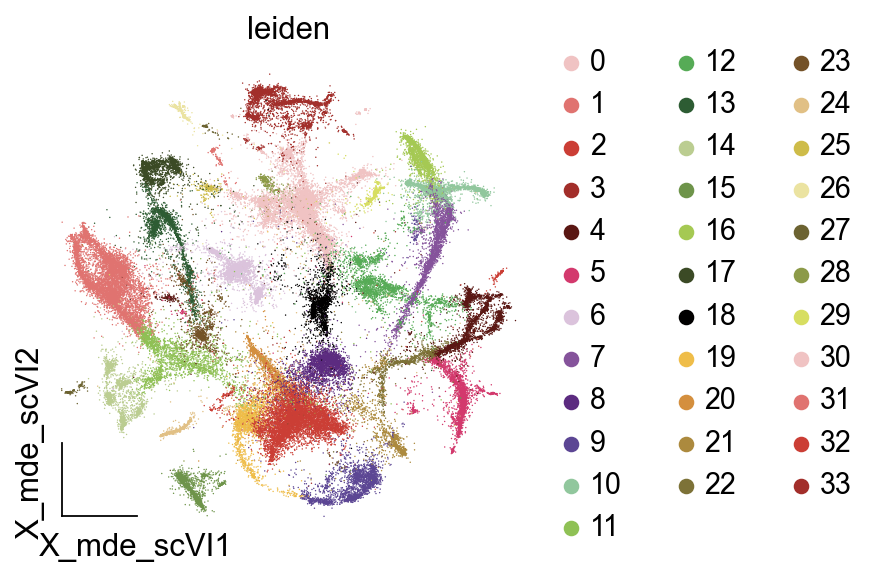

In [10]:
ov.utils.embedding(rna1,
                basis='X_mde_scVI',frameon='small',palette=ov.utils.red_color+ov.utils.green_color+ov.utils.orange_color,
                color=['leiden'],show=False)

<AxesSubplot: title={'center': 'week'}, xlabel='X_mde_scVI1', ylabel='X_mde_scVI2'>

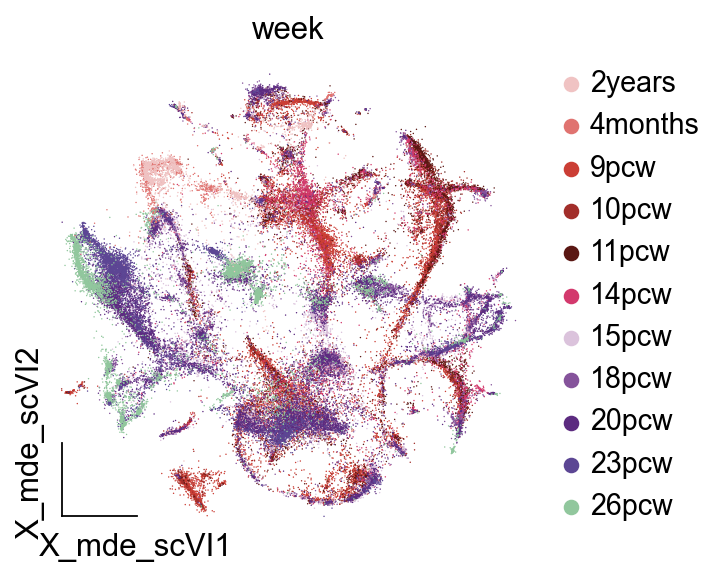

In [11]:
ov.utils.embedding(rna1,
                basis='X_mde_scVI',frameon='small',palette=ov.utils.red_color+ov.utils.green_color+ov.utils.orange_color,
                color=['week'],show=False)

<AxesSubplot: title={'center': 'leiden'}, xlabel='X_mde_scglue1', ylabel='X_mde_scglue2'>

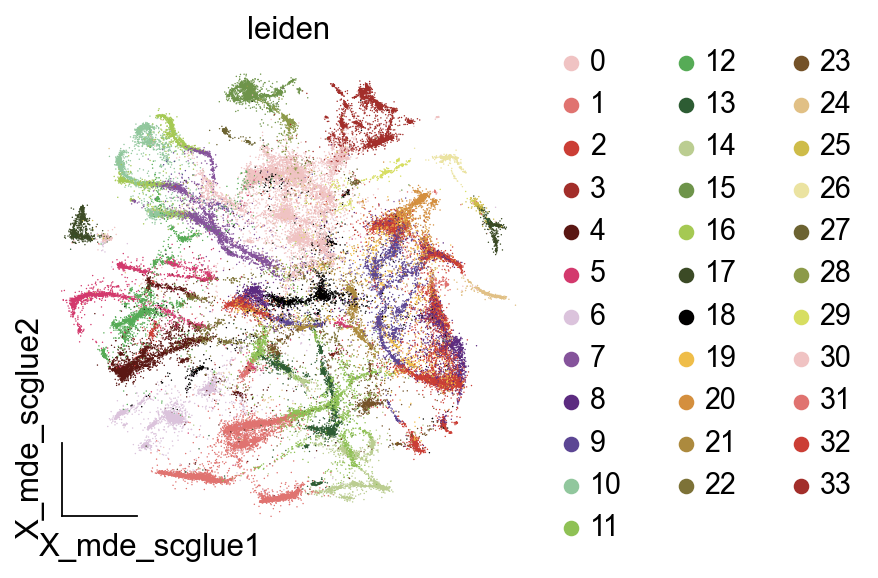

In [13]:
ov.utils.embedding(rna1,
                basis='X_mde_scglue',frameon='small',palette=ov.utils.red_color+ov.utils.green_color+ov.utils.orange_color,
                color=['leiden'],show=False)

In [16]:
small_marker_dict={
    'Rod': ['NRL','NR2E3','GNAT1'],
    'Rod pre': ['NRL','CRX','RCVRN'],
    'Tumor cells':['HELLS','MCM3','PCNA'],
    'CPC':['ARR3','GUCA1A','RXRG'],
    'LC':['CRYAB','HBA2','HBA1','LIM2'],
    'AC': ['TFAP2A','NRXN2','PAX6','GAD1'],
    'BC': ['CADPS', 'VSX1','CA10','CAMK2B'],
    'Müller glia cells': ['VIM','SOX2','SOX9','GLUL'],
    'Microglia':['C1QA','HLA-DRA','PTPRC'],
    'RPC': ['SOX2','CCND1','SFRP2'],
    'MC':['CD44','MLANA','TYRP1'],
    'FB':['COL1A1','COL1A2','COL3A1'],
    'RPE':['PMEL','DCT','SERPINF1'],
    'Cone': ['PDE6H','GUCA1C','ARR3','GNB3','GNAT2'],
    'HC':['ONECUT2','PROX1','STMN2'],
    'RGC': ['ISL1','NEFL','GAP43'],
    'Vsacular':['TM4SF1','CLDN5'],
    
}
# check if the markers are in the data
smarker_genes_in_data = dict()
for ct, markers in small_marker_dict.items():
    markers_found = list()
    for marker in markers:
        if marker in rna1.raw.var_names:
            markers_found.append(marker)
    smarker_genes_in_data[ct] = markers_found
#del [] # remove the last marker
del_markers = list()
for ct, markers in smarker_genes_in_data.items():
    if markers==[]:
        del_markers.append(ct)
for ct in del_markers:
    del smarker_genes_in_data[ct]

Storing dendrogram info using `.uns['dendrogram_leiden']`
categories: 0, 1, 2, etc.
var_group_labels: Rod, Rod pre, Tumor cells, etc.


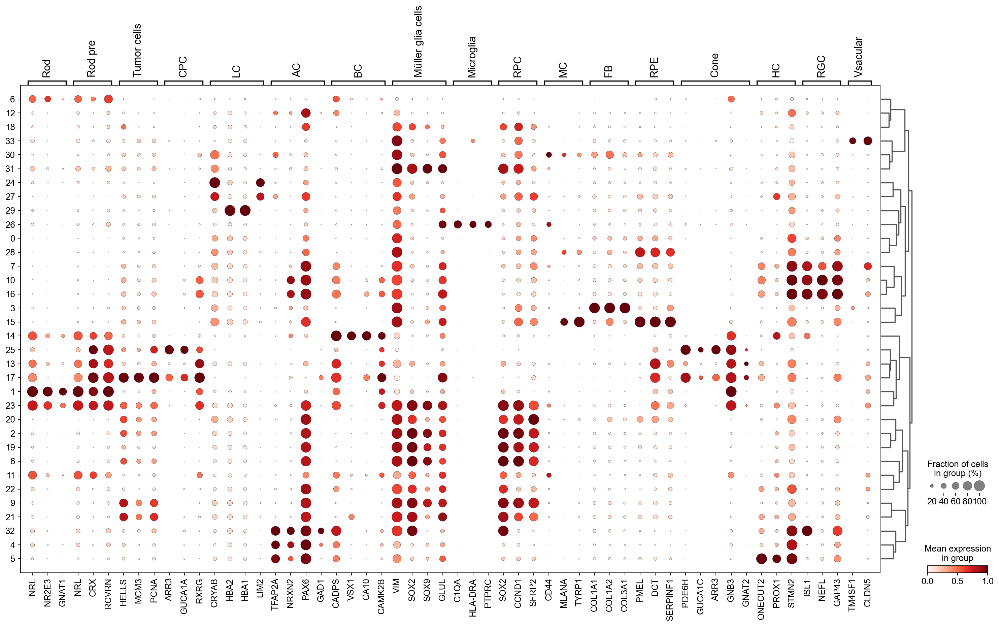

In [17]:
sc.tl.dendrogram(rna1,groupby='leiden',use_rep='X_scVI')
sc.pl.dotplot(
    rna1,
    groupby="leiden",
    var_names=smarker_genes_in_data,
    dendrogram=True,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

In [18]:
cluster2annotation = {
    '0': 'Müller cells',#1
    '1': 'Rod',#1
    '2': 'RPC',#1
    '3': 'FB',#1
    '4': 'HC',#1
    '5': 'HC',#1
    '6': 'AC',#1
    '7': 'RGC',#1
    '8': 'RPC',#1
    '9': 'RPC',#1
    '10': 'RGC',#1
    '11': 'Rod pre',#1
    '12': 'AC',#1
    '13': 'Cone',#1
    '14': 'BC',#1
    '15': 'RPE',#1
    '16': 'RGC',#1
    '17': 'Cone-tumor',#1
    '18': 'AC',#1
    '19': 'RPC',#1
    '20': 'RPC',#1
    '21': 'RPC',#1
    '22': 'RPC',#1
    '23': 'Rod',#1
    '24': 'LC',#1
    '25': 'Cone',#1
    '26': 'Microglia',#1
    '27': 'LC',#1
    '28': 'Müller cells',#
    '29': 'Red blood cells',#
    '30': 'MC',#1
    '31':'Müller cells',#1
    '32':'HC',#1
    '33':'VC',#1

}
rna1.obs['celltype'] = rna1.obs['leiden'].map(cluster2annotation).astype('category')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:40)


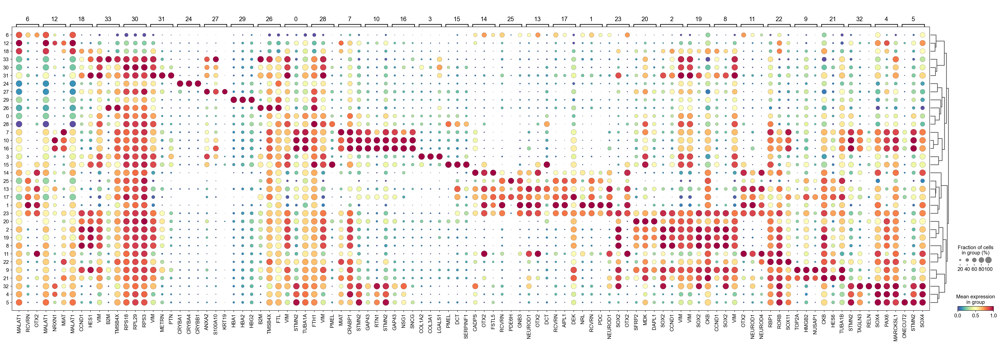

In [21]:
rna1.uns['log1p']['base']=None
sc.tl.rank_genes_groups(rna1, 'leiden', method='t-test')
sc.pl.rank_genes_groups_dotplot(rna1,groupby='leiden',
                                cmap='Spectral_r',
                                standard_scale='var',n_genes=3)

**finished identifying marker genes by COSG**


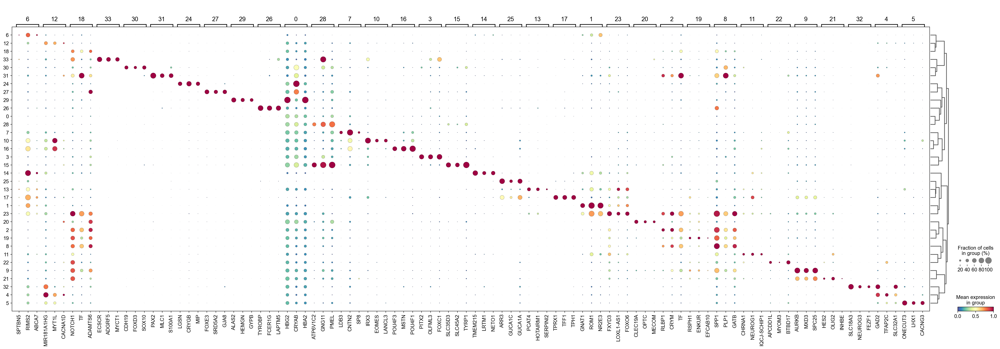

In [22]:
ov.single.cosg(rna1, key_added='cosg', groupby='leiden')
#cosg
sc.pl.rank_genes_groups_dotplot(rna1,groupby='leiden',
                                cmap='Spectral_r',key='cosg',
                                standard_scale='var',n_genes=3)

In [21]:
rna1=sc.read_h5ad('/mnt/home/yihanzhao/RB/data_new/rna_anno.h5ad')

<AxesSubplot: title={'center': 'celltype'}, xlabel='X_mde_scVI1', ylabel='X_mde_scVI2'>

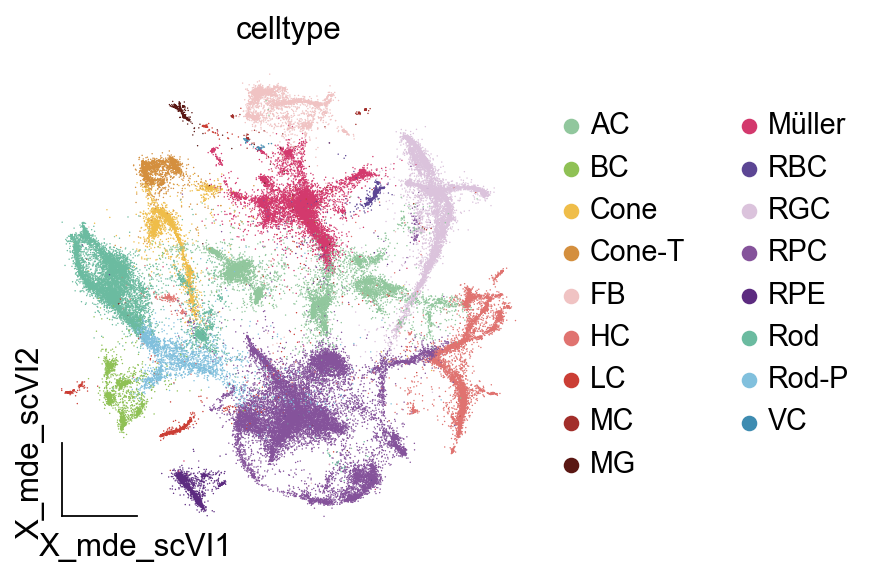

In [4]:
ov.utils.embedding(rna1,
                basis='X_mde_scVI',frameon='small',palette=ov.utils.green_color[:2]+ov.utils.orange_color[:2]+ov.utils.red_color[:6]+ov.utils.red_color[9:]+ov.utils.red_color[6:9]+ov.utils.blue_color[1:],
                color=['celltype'],show=False)

In [5]:
rna1

AnnData object with n_obs × n_vars = 71746 × 17236
    obs: 'tissue', 'domain', 'sample', 'week', 'nUMIs', 'mito_perc', 'detected_genes', 'cell_complexity', 'doublet_score', 'predicted_doublet', 'passing_mt', 'passing_nUMIs', 'passing_ngenes', 'n_genes', 'balancing_weight', 'leiden', 'celltype'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells', 'percent_cells', 'robust', 'mean', 'var', 'residual_variances', 'highly_variable_features', 'chrom', 'chromStart', 'chromEnd', 'name', 'score', 'strand', 'thickStart', 'thickEnd', 'itemRgb', 'blockCount', 'blockSizes', 'blockStarts', 'gene_id', 'gene_type', 'dell', 'highly_variable'
    uns: '__scglue__', 'celltype_colors', 'cosg', 'dendrogram_celltype', 'dendrogram_leiden', 'hvg', 'layers_counts', 'leiden', 'leiden_colors', 'leiden_sizes', 'log1p', 'neighbors', 'paga', 'rank_genes_groups', 'scaled|original|cum_sum_eigenvalues', 'scaled|original|pca_var_ratios', 'scrublet', 'tissue_colors', 'umap', 'week_colors'
    obsm: 'X_glue', 'X_mde_pc

In [8]:
sc.set_figure_params(scanpy=True, fontsize=18)

In [10]:
sc.set_figure_params(scanpy=True, fontsize=16)

Storing dendrogram info using `.uns['dendrogram_celltype']`


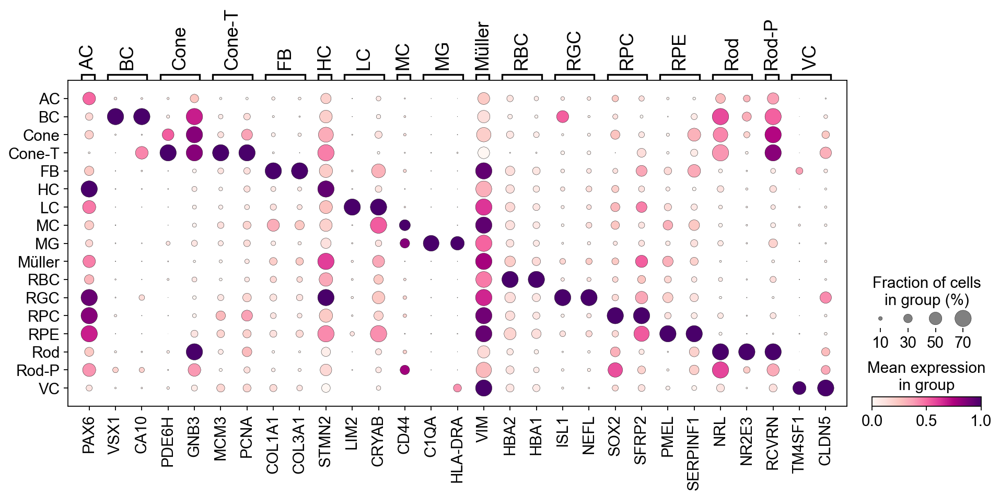

In [11]:
small_marker_dict = {
    
    'AC': ['PAX6'],
    'BC': ['VSX1','CA10'],
    'Cone': ['PDE6H','GNB3'],
    'Cone-T':['MCM3','PCNA'],
    'FB':['COL1A1','COL3A1'],
    'HC':['STMN2'],
    'LC':['LIM2','CRYAB'],
    'MC':['CD44'],
    'MG':['C1QA','HLA-DRA'],
    'Müller': ['VIM'],
    'RBC':['HBA2','HBA1'],
    'RGC': ['ISL1','NEFL'],
    'RPC': ['SOX2','SFRP2'],
    'RPE':['PMEL','SERPINF1'],
    'Rod': ['NRL','NR2E3'],
    'Rod-P': ['RCVRN'],
    'VC':['TM4SF1','CLDN5'],
   
}

# check if the markers are in the data
smarker_genes_in_data = dict()
for ct, markers in small_marker_dict.items():
    markers_found = list()
    for marker in markers:
        if marker in rna1.raw.var_names:
            markers_found.append(marker)
    smarker_genes_in_data[ct] = markers_found
#del [] # remove the last marker
del_markers = list()
for ct, markers in smarker_genes_in_data.items():
    if markers==[]:
        del_markers.append(ct)
for ct in del_markers:
    del smarker_genes_in_data[ct]
fig, ax = plt.subplots(figsize=(14,6))
sc.tl.dendrogram(rna1, groupby="celltype", use_rep='X_scVI')
sc.pl.dotplot(
    rna1,
    groupby="celltype",
    var_names=smarker_genes_in_data,
    dendrogram=False,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
    show=False,
    cmap='RdPu',
    ax=ax,
    dot_max=0.7,
    dot_min=0,
    vmin=0
)
fig.savefig('/mnt/home/yihanzhao/RB/fig1/marker-16.png',dpi=300,bbox_inches='tight')

## atac-migration

In [20]:
new_index = ["cell_" + str(i) for i, _ in enumerate(rna1.obs.index)]

rna1.obs.index = new_index

print(rna1)

AnnData object with n_obs × n_vars = 71746 × 17236
    obs: 'tissue', 'domain', 'sample', 'week', 'nUMIs', 'mito_perc', 'detected_genes', 'cell_complexity', 'doublet_score', 'predicted_doublet', 'passing_mt', 'passing_nUMIs', 'passing_ngenes', 'n_genes', 'balancing_weight', 'leiden', 'celltype'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells', 'percent_cells', 'robust', 'mean', 'var', 'residual_variances', 'highly_variable_features', 'chrom', 'chromStart', 'chromEnd', 'name', 'score', 'strand', 'thickStart', 'thickEnd', 'itemRgb', 'blockCount', 'blockSizes', 'blockStarts', 'gene_id', 'gene_type', 'dell', 'highly_variable'
    uns: '__scglue__', 'hvg', 'layers_counts', 'log1p', 'neighbors', 'scaled|original|cum_sum_eigenvalues', 'scaled|original|pca_var_ratios', 'scrublet', 'tissue_colors', 'umap', 'week_colors', 'leiden', 'paga', 'leiden_sizes', 'leiden_colors', 'dendrogram_leiden', 'celltype_colors'
    obsm: 'X_glue', 'X_mde_pca', 'X_mde_scVI', 'X_scVI', 'X_umap', 'scaled|origin

In [12]:
atac=sc.read_h5ad('/mnt/data/yihan/glue/all/atac-all-emb.h5ad')

In [21]:
atac

AnnData object with n_obs × n_vars = 85418 × 150000
    obs: 'sample', 'week', 'tissue', 'balancing_weight', 'domain'
    var: 'chrom', 'chromStart', 'chromEnd', 'highly_variable'
    uns: 'AnnDataSet', '__scglue__', 'neighbors', 'reference_sequences', 'sample_colors', 'umap'
    obsm: 'X_glue', 'X_lsi', 'X_mde_lsi', 'X_umap'
    varm: 'X_glue'
    obsp: 'connectivities', 'distances'

In [22]:
new_index = ["cell_" + str(i) for i, _ in enumerate(atac.obs.index)]

# 将新索引赋值给 RNA DataFrame 的索引
atac.obs.index = new_index

# 输出修改后的 RNA DataFrame
print(atac)

AnnData object with n_obs × n_vars = 85418 × 150000
    obs: 'sample', 'week', 'tissue', 'balancing_weight', 'domain'
    var: 'chrom', 'chromStart', 'chromEnd', 'highly_variable'
    uns: 'AnnDataSet', '__scglue__', 'neighbors', 'reference_sequences', 'sample_colors', 'umap'
    obsm: 'X_glue', 'X_lsi', 'X_mde_lsi', 'X_umap'
    varm: 'X_glue'
    obsp: 'connectivities', 'distances'


In [23]:
atac.obs

,sample,week,tissue,balancing_weight,domain
cell_0,GSM7119499_10pcw_scATAC,10pcw,retina,0.593776,scATAC-seq
cell_1,GSM7119499_10pcw_scATAC,10pcw,retina,0.593776,scATAC-seq
cell_2,GSM7119499_10pcw_scATAC,10pcw,retina,0.593776,scATAC-seq
cell_3,GSM7119499_10pcw_scATAC,10pcw,retina,0.593776,scATAC-seq
cell_4,GSM7119499_10pcw_scATAC,10pcw,retina,0.985425,scATAC-seq
...,...,...,...,...,...
cell_85413,GSM7119498_9pcw_scATAC,9pcw,retina,0.638050,scATAC-seq
cell_85414,GSM7119498_9pcw_scATAC,9pcw,retina,0.990949,scATAC-seq
cell_85415,GSM7119498_9pcw_scATAC,9pcw,retina,0.990949,scATAC-seq
cell_85416,GSM7119498_9pcw_scATAC,9pcw,retina,0.593776,scATAC-seq


<AxesSubplot: title={'center': 'sample'}, xlabel='X_mde_lsi1', ylabel='X_mde_lsi2'>

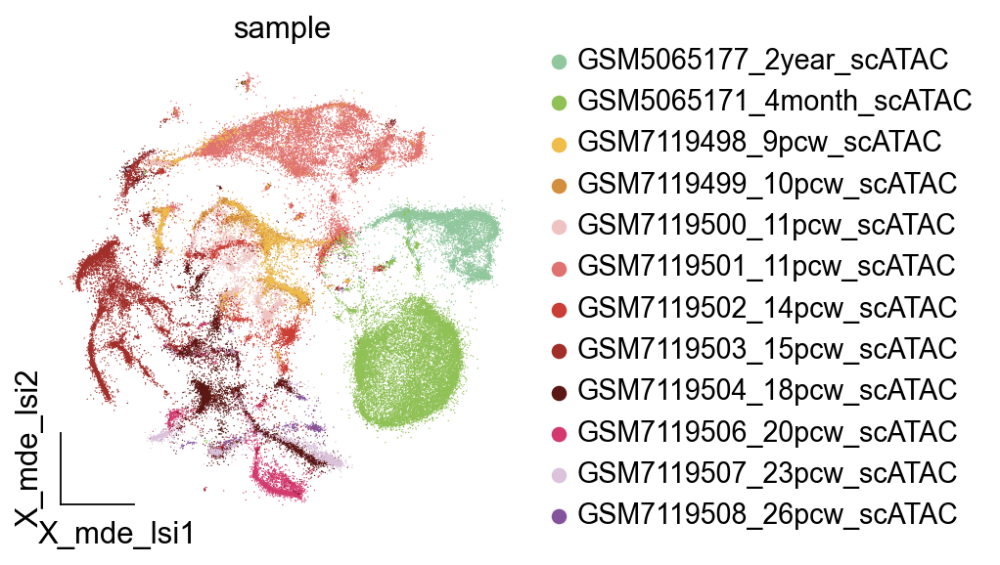

In [24]:
ov.utils.embedding(atac,
                basis='X_mde_lsi',frameon='small',palette=ov.utils.green_color[:2]+ov.utils.orange_color[:2]+ov.utils.red_color+ov.utils.green_color[5:],
                color=['sample'],show=False)

In [25]:
from scvi.model.utils import mde
atac.obsm["X_mde_scglue"] = mde(atac.obsm["X_glue"])

In [28]:
knn_transformer=ov.utils.weighted_knn_trainer(
    train_adata=rna1,
    train_adata_emb='X_glue',
    n_neighbors=15,
)

Weighted KNN with n_neighbors = 15 ... 

In [30]:
labels,uncert=ov.utils.weighted_knn_transfer(
    query_adata=atac,
    query_adata_emb='X_glue',
    label_keys='celltype',
    knn_model=knn_transformer,
    ref_adata_obs=rna1.obs,
)

finished!


In [31]:
atac.obs["transf_celltype"]=labels.loc[atac.obs.index,"celltype"]
atac.obs["transf_celltype_unc"]=uncert.loc[atac.obs.index,"celltype"]

In [32]:
atac.obs["celltype"]=atac.obs["transf_celltype"].copy()

[<AxesSubplot: title={'center': 'transf_celltype_unc'}, xlabel='X_mde_scglue1', ylabel='X_mde_scglue2'>,
 <AxesSubplot: title={'center': 'transf_celltype'}, xlabel='X_mde_scglue1', ylabel='X_mde_scglue2'>]

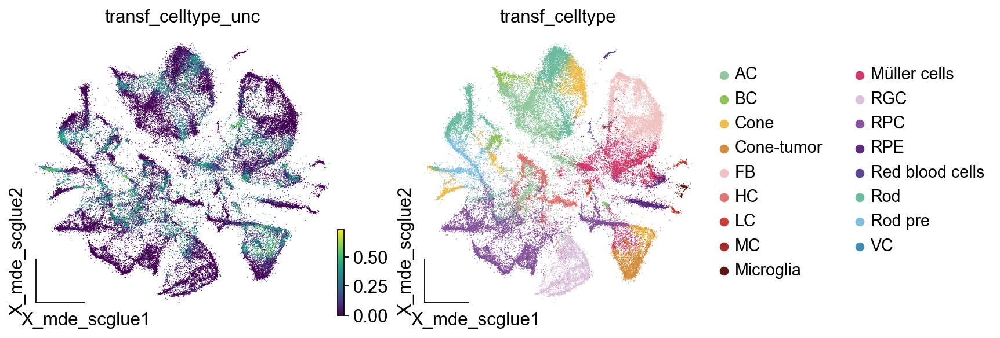

In [33]:
ov.utils.embedding(atac,
               basis='X_mde_scglue',
               color=['transf_celltype_unc','transf_celltype'],
                #title='Cell type Un',
                show=False,
                palette=ov.utils.green_color[:2]+ov.utils.orange_color[:2]+ov.utils.red_color+ov.utils.blue_color[1:],
                frameon='small'
               )

<AxesSubplot: title={'center': 'celltype'}, xlabel='X_mde_scglue1', ylabel='X_mde_scglue2'>

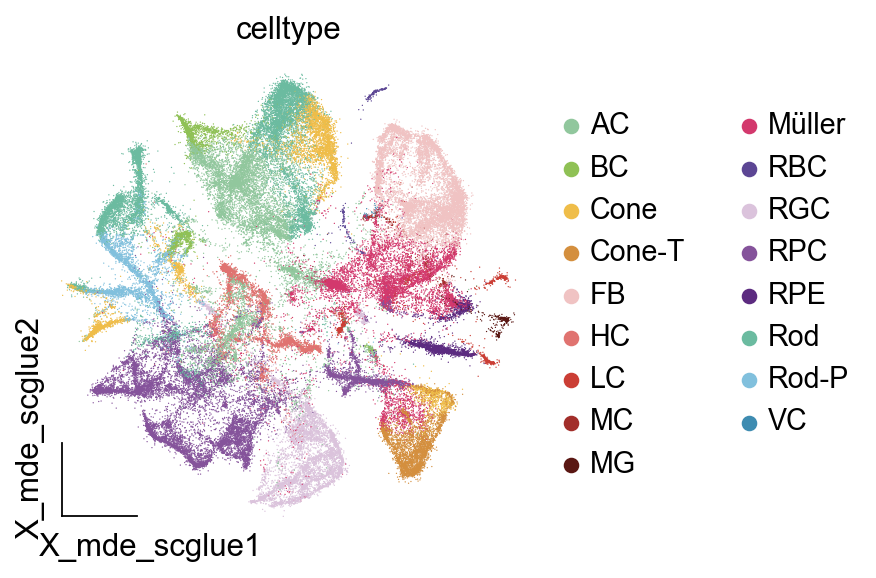

In [10]:
ov.utils.embedding(atac,
                basis='X_mde_scglue',frameon='small',palette=ov.utils.green_color[:2]+ov.utils.orange_color[:2]+ov.utils.red_color[:6]+ov.utils.red_color[9:]+ov.utils.red_color[6:9]+ov.utils.blue_color[1:],
                color=['celltype'],show=False)

In [35]:
atac.obs.drop(columns=['transf_celltype_unc'], inplace=True)

In [36]:
atac.write_h5ad('/mnt/home/yihanzhao/RB/data_new/atac_anno_new.h5ad',compression='gzip')

## act-expre

In [12]:
act=sc.read('/mnt/data/yihan/atac_test/act/act_all_raw_new.h5ad')
act

AnnData object with n_obs × n_vars = 85418 × 61217
    obs: 'tsse', 'n_fragment', 'frac_dup', 'frac_mito', 'sample', 'doublet_probability', 'doublet_score'

In [13]:
new_index = ["cell_" + str(i) for i, _ in enumerate(act.obs.index)]

act.obs.index = new_index

print(act)

AnnData object with n_obs × n_vars = 85418 × 61217
    obs: 'tsse', 'n_fragment', 'frac_dup', 'frac_mito', 'sample', 'doublet_probability', 'doublet_score'


In [14]:
act=act[atac.obs.index.tolist()]
act.obs=atac.obs.copy()
act.obsp=atac.obsp.copy()
act.obsm=atac.obsm.copy()

In [15]:
act.obs.head()

,sample,week,tissue,balancing_weight,domain,transf_celltype,celltype
cell_0,GSM7119499_10pcw_scATAC,10pcw,retina,0.593776,scATAC-seq,RGC,RGC
cell_1,GSM7119499_10pcw_scATAC,10pcw,retina,0.593776,scATAC-seq,AC,AC
cell_2,GSM7119499_10pcw_scATAC,10pcw,retina,0.593776,scATAC-seq,RPC,RPC
cell_3,GSM7119499_10pcw_scATAC,10pcw,retina,0.593776,scATAC-seq,RGC,RGC
cell_4,GSM7119499_10pcw_scATAC,10pcw,retina,0.985425,scATAC-seq,RGC,RGC


In [16]:
act.layers['count']=act.X.copy()
sc.pp.normalize_total(
            act, 
#            target_sum=1e4,
        )
sc.pp.log1p(act)

normalizing counts per cell
    finished (0:00:17)


In [18]:
sc.set_figure_params(scanpy=True, fontsize=18)

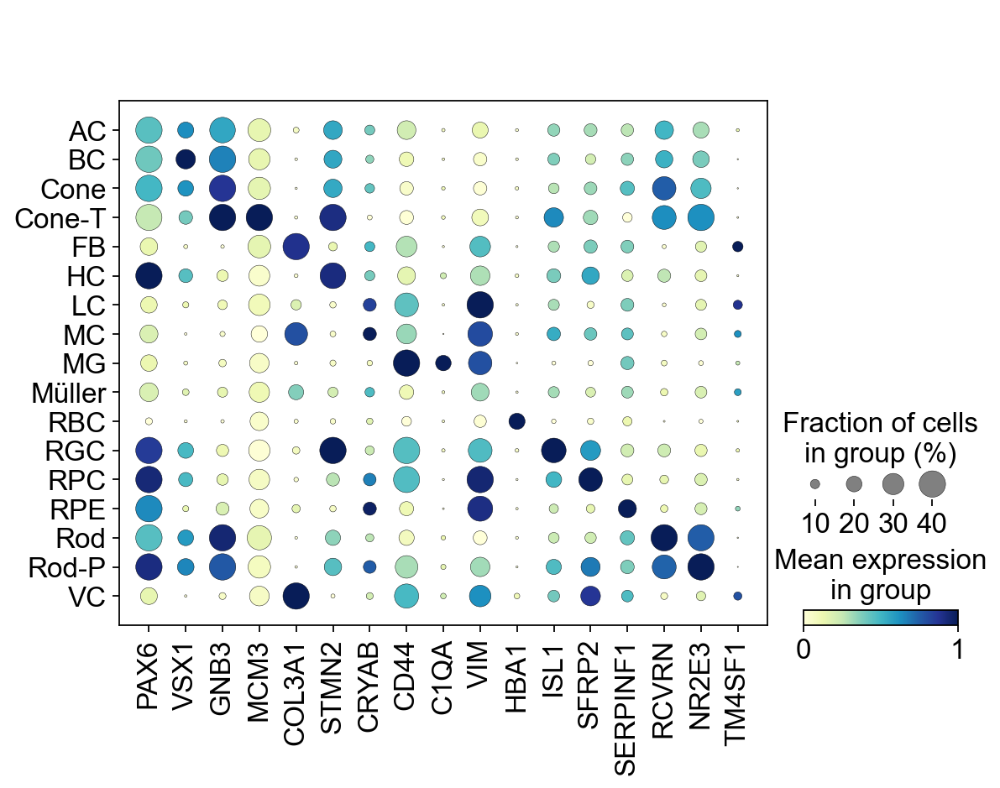

In [19]:
markers=['PAX6',#'MALAT1',
         'VSX1',#'CA10',
         'GNB3',#'PDE6H',
         'MCM3',#'PCNA',
         'COL3A1',#'COL1A1',
         'STMN2',
         'CRYAB',#'LIM2',
         'CD44',
         'C1QA',#'HLA-DRA',
         'VIM',
         'HBA1',#'HBA2',
         'ISL1',#'NEFL',
         'SFRP2',#'SOX2',
         'SERPINF1',#'PMEL',
         
         'RCVRN',
         'NR2E3',#'NRL',
         'TM4SF1',#'CLDN5'
    ]
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(8,6))
sc.pl.dotplot(act,markers,groupby='celltype',dot_max=0.4,dot_min=0,vmax=1.0,
             standard_scale="var",show=False,ax=ax,cmap= 'YlGnBu')
fig.savefig('/mnt/home/yihanzhao/RB/fig1/act-18.png',dpi=300,bbox_inches='tight')

In [ ]:
act.obs = act.obs.drop(columns=['transf_celltype_unc'])

In [51]:
act.write_h5ad('/mnt/home/yihanzhao/RB/data_new/act_anno.h5ad',compression='gzip')

## month-umap

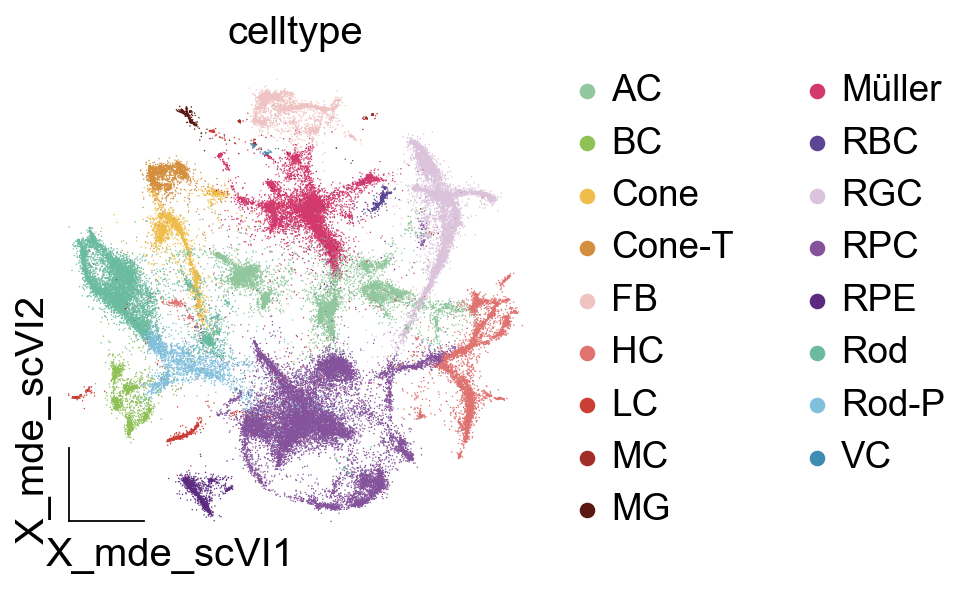

In [24]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(4,4))
ov.utils.embedding(rna1,
                basis='X_mde_scVI',frameon='small',palette=ov.utils.green_color[:2]+ov.utils.orange_color[:2]+ov.utils.red_color[:6]+ov.utils.red_color[9:]+ov.utils.red_color[6:9]+ov.utils.blue_color[1:],
                color=['celltype'],show=False,ax=ax)
fig.savefig('/mnt/home/yihanzhao/RB/fig1/sfig1/umap-rna.png',dpi=300,bbox_inches='tight')

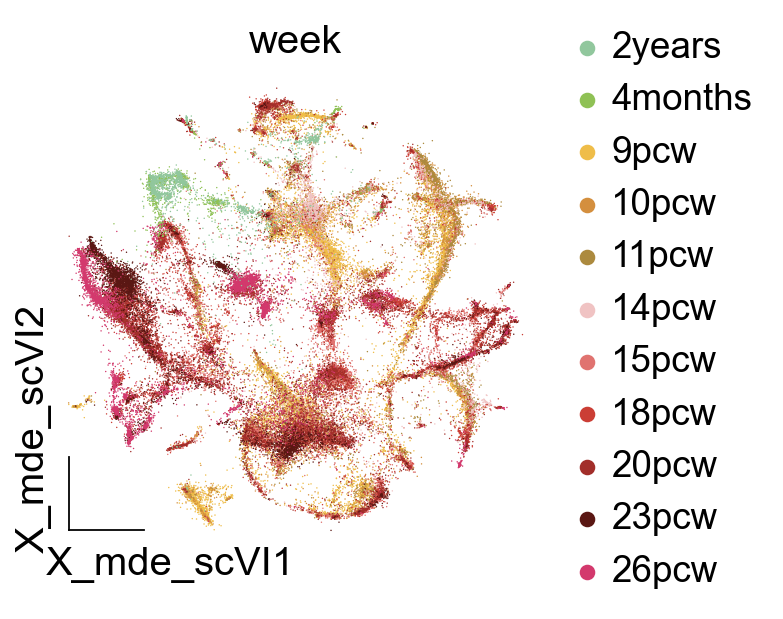

In [25]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(4,4))
ov.utils.embedding(rna1,
                basis='X_mde_scVI',frameon='small',palette=ov.utils.green_color[:2]+ov.utils.orange_color[:3]+ov.utils.red_color[:7]+ov.utils.blue_color[1:],
                color=['week'],show=False,ax=ax)
fig.savefig('/mnt/home/yihanzhao/RB/fig1/sfig1/umap-month.png',dpi=300,bbox_inches='tight')

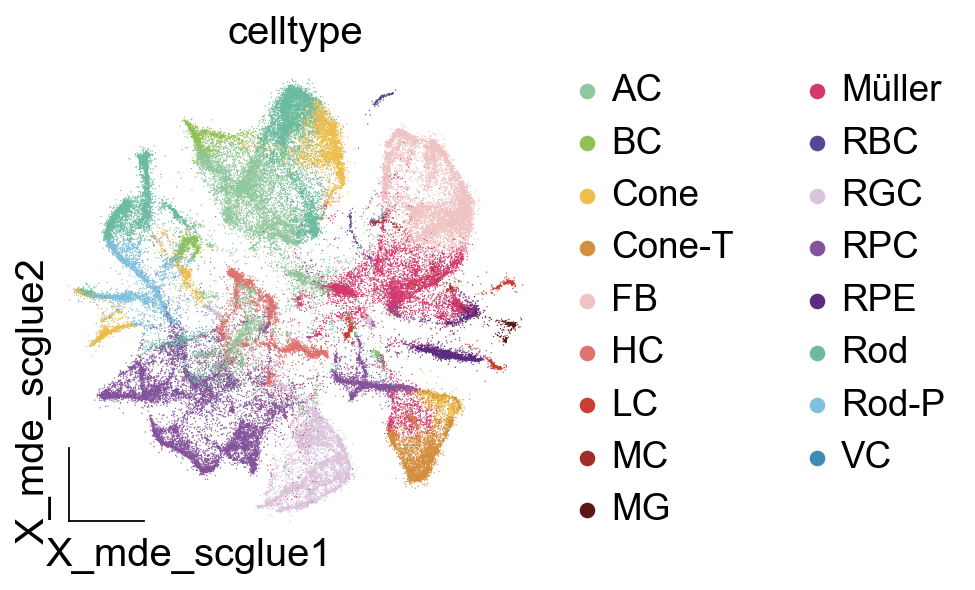

In [28]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(4,4))
ov.utils.embedding(atac,
                basis='X_mde_scglue',frameon='small',palette=ov.utils.green_color[:2]+ov.utils.orange_color[:2]+ov.utils.red_color[:6]+ov.utils.red_color[9:]+ov.utils.red_color[6:9]+ov.utils.blue_color[1:],
                color=['celltype'],show=False,ax=ax)
fig.savefig('/mnt/home/yihanzhao/RB/fig1/sfig1/umap-atac.png',dpi=300,bbox_inches='tight')

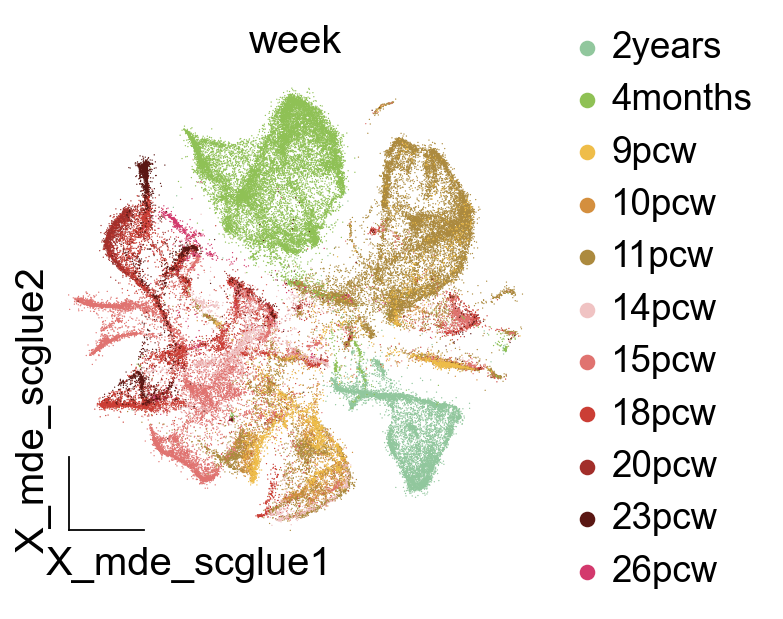

In [29]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(4,4))
ov.utils.embedding(atac,
                basis='X_mde_scglue',frameon='small',palette=ov.utils.green_color[:2]+ov.utils.orange_color[:3]+ov.utils.red_color[:7]+ov.utils.blue_color[1:],
                color=['week'],show=False,ax=ax)
fig.savefig('/mnt/home/yihanzhao/RB/fig1/sfig1/umap-month-atac.png',dpi=300,bbox_inches='tight')

## percentage

In [3]:
rna1=sc.read_h5ad('/mnt/home/yihanzhao/RB/data_new/rna_anno.h5ad')

<AxesSubplot: title={'center': 'celltype'}, xlabel='X_mde_scVI1', ylabel='X_mde_scVI2'>

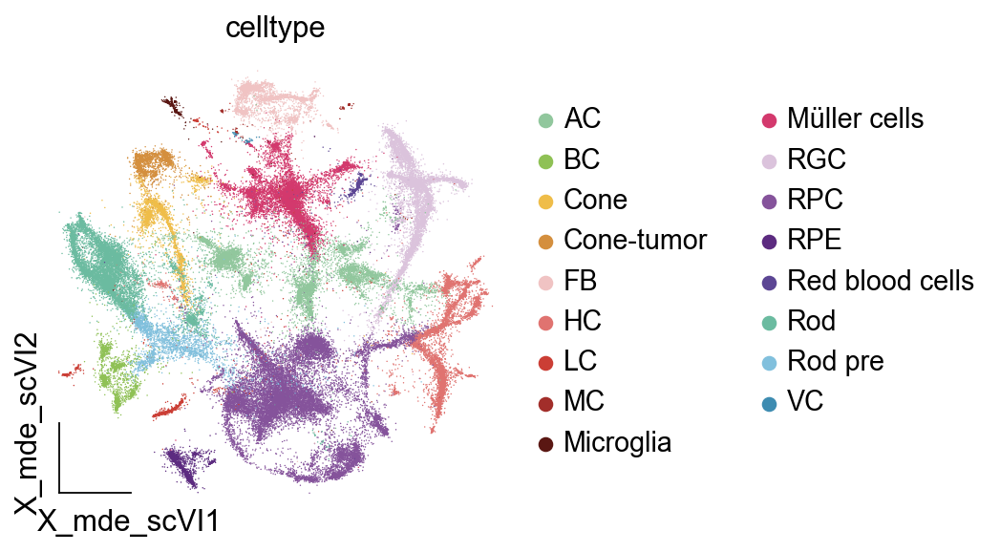

In [5]:
ov.utils.embedding(rna1,
                basis='X_mde_scVI',frameon='small',palette=ov.utils.green_color[:2]+ov.utils.orange_color[:2]+ov.utils.red_color+ov.utils.blue_color[1:],
                color=['celltype'],show=False)

In [5]:
from sccoda.util import cell_composition_data as dat
from sccoda.util import data_visualization as viz

In [6]:
import seaborn as sns
print('seaborn(Ver): ',sns.__version__)

seaborn(Ver):  0.12.2


In [32]:
data1 = rna1[rna1.obs['tissue']=='rb'].obs['celltype'].value_counts().to_frame(name='rb')
data1 = data1.T
data1 = data1.fillna(0)
data1['Type'] = data1.index
data1_rna1 = dat.from_pandas(data1, covariate_columns=["Type"])
print(data1_rna1.X)
print(data1_rna1.obs)
cell_index = data1_rna1.var.index

[[1861.  722.  356.  347.  103.   33.   31.   30.   24.   17.   15.   13.
     5.    2.    2.]]
   Type
rb   rb


<AxesSubplot: title={'center': 'samples'}, ylabel='Proportion'>

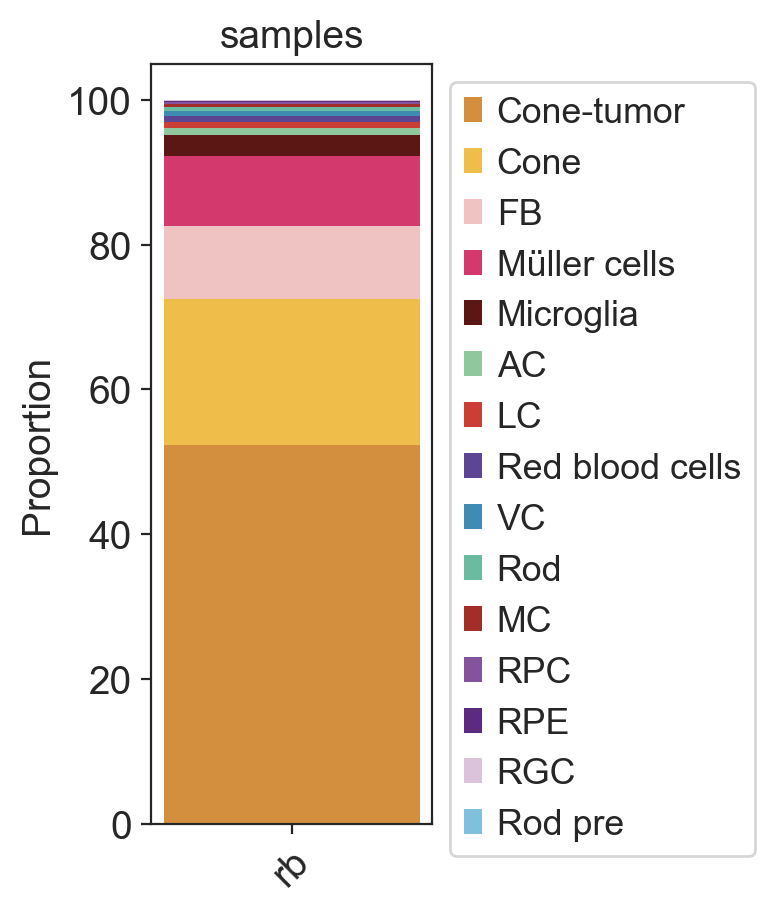

In [39]:
from matplotlib.colors import ListedColormap, BoundaryNorm
sns.set_style("ticks")
type_color_T = [
 '#d48f3e',
 '#efbd49',
 '#f0c3c3',
 '#d3396d',
 '#5a1713',
 '#91c79d',
 '#cb3e35',
    
 '#5c4694',
 '#3e8cb1',
 '#6bbba0', 
 '#a22e2a',
 '#85539b',
 '#5c2b80',
 '#dbc3dc',
 '#81c0dd',
]
viz.stacked_barplot(data1_rna1,feature_name="samples",figsize=(1.8,5),plot_legend=True,cmap=ListedColormap(type_color_T))

In [8]:
data2 = rna1[rna1.obs['tissue']=='retina'].obs['celltype'].value_counts().to_frame(name='retina')
data2 = data2.T
data2 = data2.fillna(0)
data2['Type'] = data2.index
data2_rna1 = dat.from_pandas(data2, covariate_columns=["Type"])
print(data2_rna1.X)
print(data2_rna1.obs)
cell_index = data2_rna1.var.index

[[1.7589e+04 8.3330e+03 7.9650e+03 7.1590e+03 7.1280e+03 6.2680e+03
  2.9960e+03 2.3910e+03 2.1270e+03 2.0930e+03 2.0660e+03 1.0550e+03
  3.9000e+02 3.8400e+02 1.9200e+02 3.9000e+01 1.0000e+01]]
          Type
retina  retina


<AxesSubplot: title={'center': 'samples'}, ylabel='Proportion'>

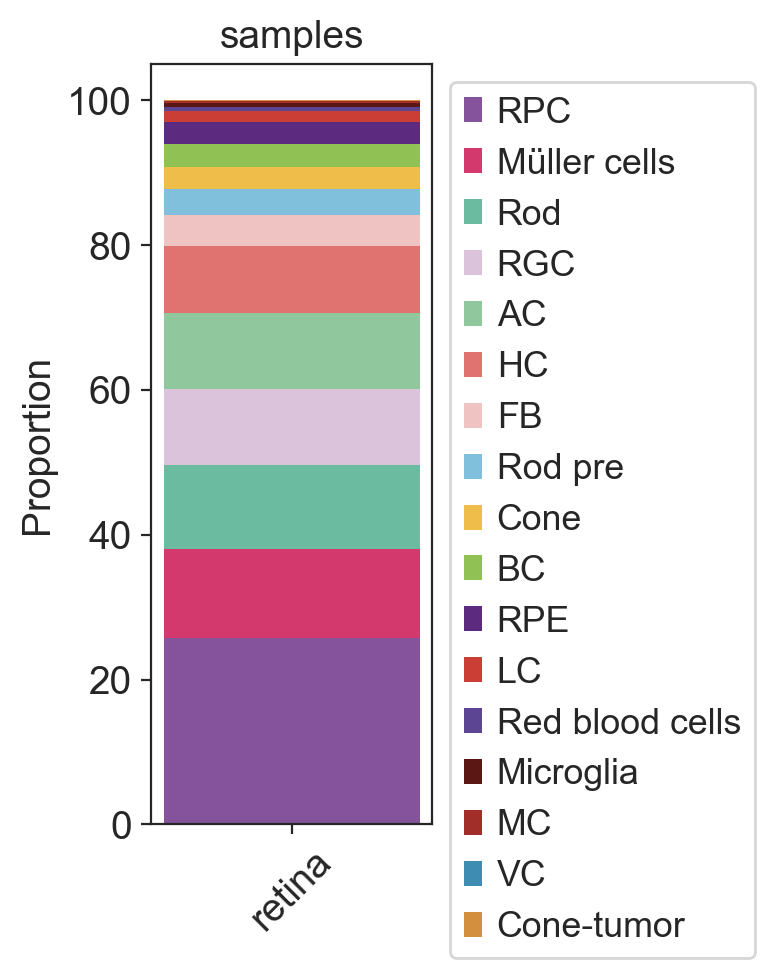

In [11]:
from matplotlib.colors import ListedColormap, BoundaryNorm
sns.set_style("ticks") 
type_color_T = [
 '#85539b',
 '#d3396d',
 '#6bbba0', 
 '#dbc3dc',
 '#91c79d',
 '#e07370',#HC
 '#f0c3c3',
 '#81c0dd',


 '#efbd49',
 '#8fc155',#BC
 '#5c2b80',
 '#cb3e35',
 '#5c4694',
 '#5a1713',
 '#a22e2a',
 '#3e8cb1',
 '#d48f3e',

]
viz.stacked_barplot(data2_rna1,feature_name="samples",figsize=(1.8,5),plot_legend=True,cmap=ListedColormap(type_color_T))

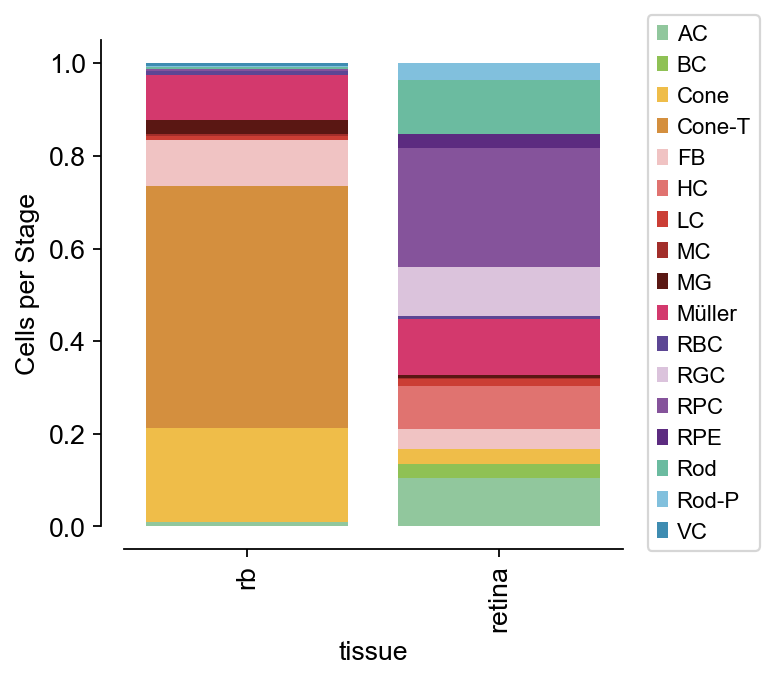

In [4]:
fig,ax=plt.subplots(figsize = (4,4))
ov.pl.cellproportion(adata=rna1,celltype_clusters='celltype',
                    groupby='tissue',
                     #groupby_li=['nIPC','Granule immature','Granule mature'],
                     legend=True,ax=ax)


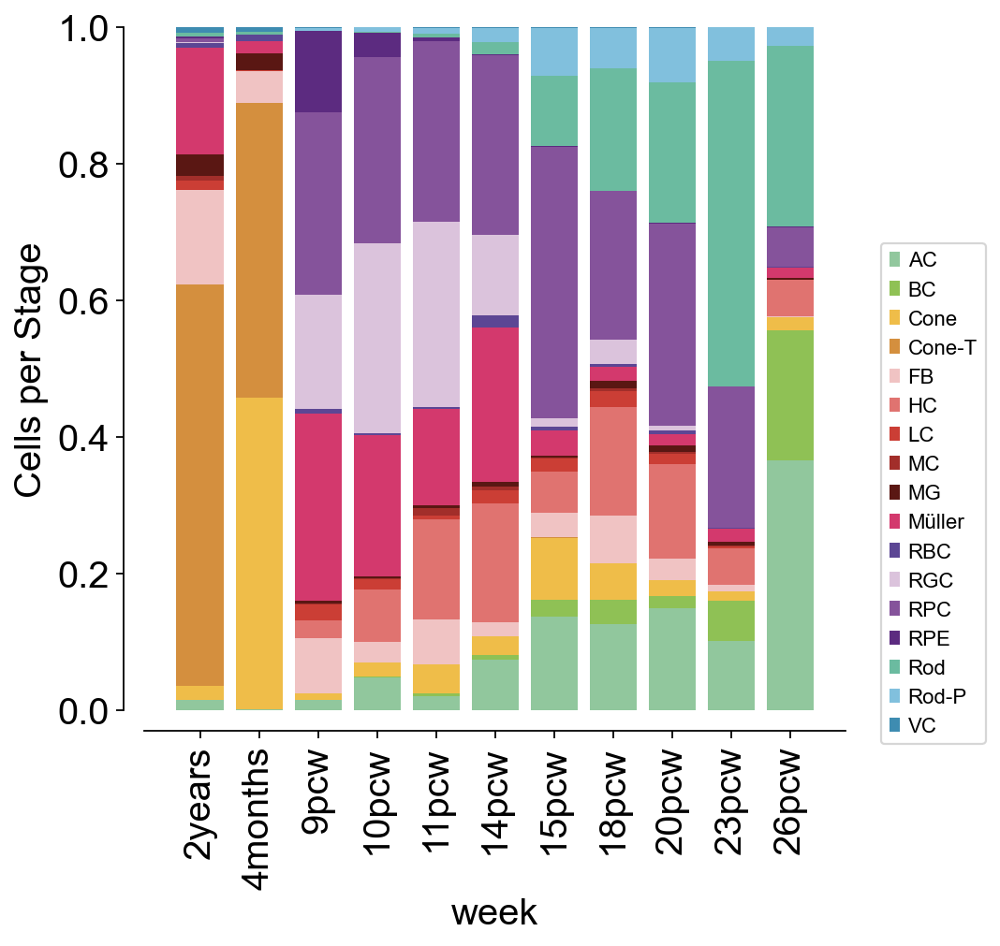

In [31]:
fig,ax=plt.subplots(figsize = (6,6))
ov.pl.cellproportion(adata=rna1,celltype_clusters='celltype',
                    groupby='week',
                     #groupby_li=['nIPC','Granule immature','Granule mature'],
                     legend=True,ax=ax,ticks_fontsize=18,
    labels_fontsize=18)
fig.savefig('/mnt/home/yihanzhao/RB/fig1/baifenbi.png',dpi=300,bbox_inches='tight')

<AxesSubplot: title={'center': 'week'}, xlabel='X_mde_scVI1', ylabel='X_mde_scVI2'>

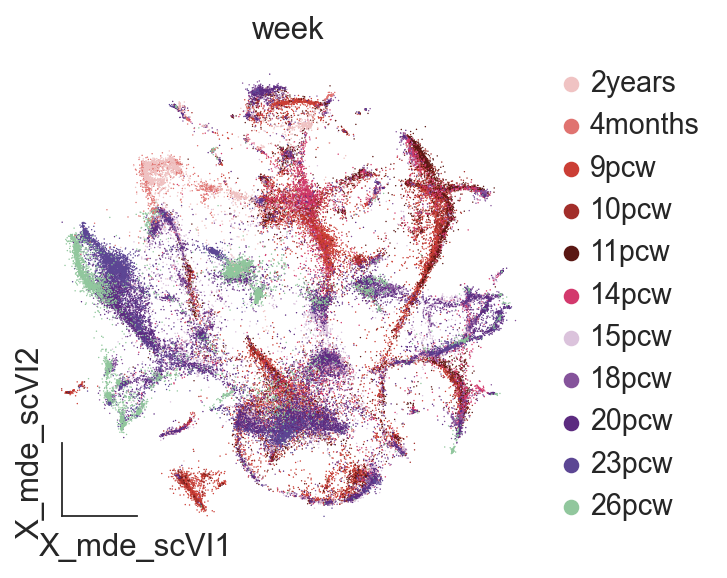

In [9]:
ov.utils.embedding(rna1,
                basis='X_mde_scVI',frameon='small',palette=ov.utils.red_color+ov.utils.green_color+ov.utils.orange_color,
                color=['week'],show=False)

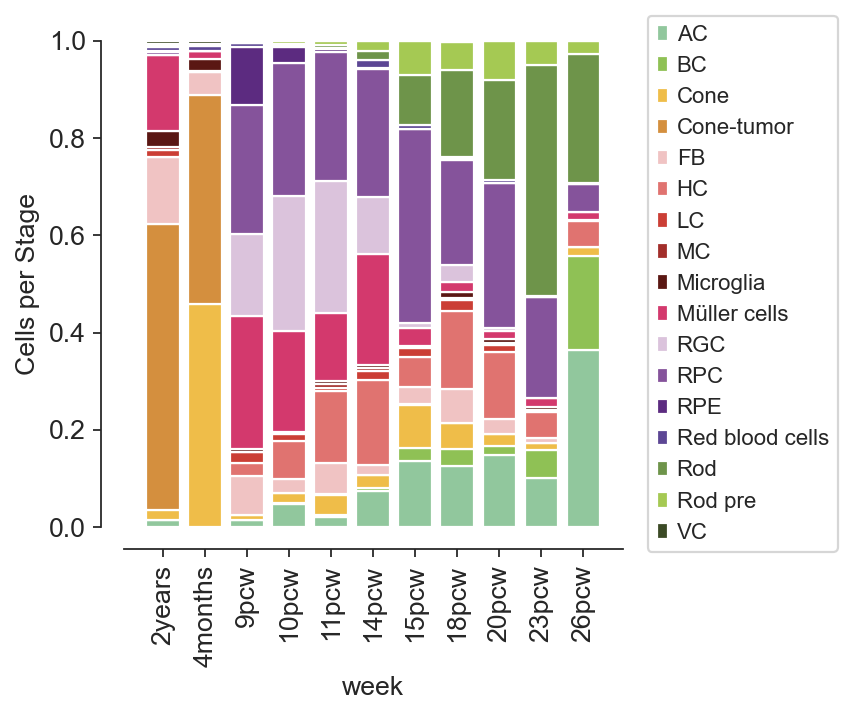

In [10]:
fig,ax=plt.subplots(figsize = (6,6))
ov.pl.cellproportion(adata=rna1,celltype_clusters='celltype',
                    groupby='week',
                     #groupby_li=['nIPC','Granule immature','Granule mature'],
                     legend=True,ax=ax)

In [8]:
rna_cone_tumor=rna1[rna1.obs['celltype']=='Cone-tumor']
rna_cone_tumor

View of AnnData object with n_obs × n_vars = 1871 × 17236
    obs: 'tissue', 'domain', 'sample', 'week', 'nUMIs', 'mito_perc', 'detected_genes', 'cell_complexity', 'doublet_score', 'predicted_doublet', 'passing_mt', 'passing_nUMIs', 'passing_ngenes', 'n_genes', 'balancing_weight', 'leiden', 'celltype'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells', 'percent_cells', 'robust', 'mean', 'var', 'residual_variances', 'highly_variable_features', 'chrom', 'chromStart', 'chromEnd', 'name', 'score', 'strand', 'thickStart', 'thickEnd', 'itemRgb', 'blockCount', 'blockSizes', 'blockStarts', 'gene_id', 'gene_type', 'dell', 'highly_variable'
    uns: '__scglue__', 'celltype_colors', 'cosg', 'dendrogram_celltype', 'dendrogram_leiden', 'hvg', 'layers_counts', 'leiden', 'leiden_colors', 'leiden_sizes', 'log1p', 'neighbors', 'paga', 'rank_genes_groups', 'scaled|original|cum_sum_eigenvalues', 'scaled|original|pca_var_ratios', 'scrublet', 'tissue_colors', 'umap', 'week_colors'
    obsm: 'X_glue', 'X

In [8]:
rna_rb=rna1[rna1.obs['tissue']=='rb']
rna_rb

View of AnnData object with n_obs × n_vars = 3561 × 17236
    obs: 'tissue', 'domain', 'sample', 'week', 'nUMIs', 'mito_perc', 'detected_genes', 'cell_complexity', 'doublet_score', 'predicted_doublet', 'passing_mt', 'passing_nUMIs', 'passing_ngenes', 'n_genes', 'balancing_weight', 'leiden', 'celltype'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells', 'percent_cells', 'robust', 'mean', 'var', 'residual_variances', 'highly_variable_features', 'chrom', 'chromStart', 'chromEnd', 'name', 'score', 'strand', 'thickStart', 'thickEnd', 'itemRgb', 'blockCount', 'blockSizes', 'blockStarts', 'gene_id', 'gene_type', 'dell', 'highly_variable'
    uns: '__scglue__', 'celltype_colors', 'cosg', 'dendrogram_celltype', 'dendrogram_leiden', 'hvg', 'layers_counts', 'leiden', 'leiden_colors', 'leiden_sizes', 'log1p', 'neighbors', 'paga', 'rank_genes_groups', 'scaled|original|cum_sum_eigenvalues', 'scaled|original|pca_var_ratios', 'scrublet', 'tissue_colors', 'umap', 'week_colors'
    obsm: 'X_glue', 'X

In [9]:
rna_rpc=rna_rb[rna_rb.obs['celltype']=='RPC']
rna_rpc

View of AnnData object with n_obs × n_vars = 13 × 17236
    obs: 'tissue', 'domain', 'sample', 'week', 'nUMIs', 'mito_perc', 'detected_genes', 'cell_complexity', 'doublet_score', 'predicted_doublet', 'passing_mt', 'passing_nUMIs', 'passing_ngenes', 'n_genes', 'balancing_weight', 'leiden', 'celltype'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells', 'percent_cells', 'robust', 'mean', 'var', 'residual_variances', 'highly_variable_features', 'chrom', 'chromStart', 'chromEnd', 'name', 'score', 'strand', 'thickStart', 'thickEnd', 'itemRgb', 'blockCount', 'blockSizes', 'blockStarts', 'gene_id', 'gene_type', 'dell', 'highly_variable'
    uns: '__scglue__', 'celltype_colors', 'cosg', 'dendrogram_celltype', 'dendrogram_leiden', 'hvg', 'layers_counts', 'leiden', 'leiden_colors', 'leiden_sizes', 'log1p', 'neighbors', 'paga', 'rank_genes_groups', 'scaled|original|cum_sum_eigenvalues', 'scaled|original|pca_var_ratios', 'scrublet', 'tissue_colors', 'umap', 'week_colors'
    obsm: 'X_glue', 'X_m

In [21]:
sc.set_figure_params(scanpy=True, fontsize=14)

In [23]:
help(ov.pl.cellstackarea)

Help on function cellstackarea in module omicverse.pl._single:

cellstackarea(adata, celltype_clusters: str, groupby: str, groupby_li=None, figsize: tuple = (4, 6), ticks_fontsize: int = 12, labels_fontsize: int = 12, ax=None, legend: bool = False, legend_awargs=None)
    Plot the cell type percentage in each groupby category



celltype_colors


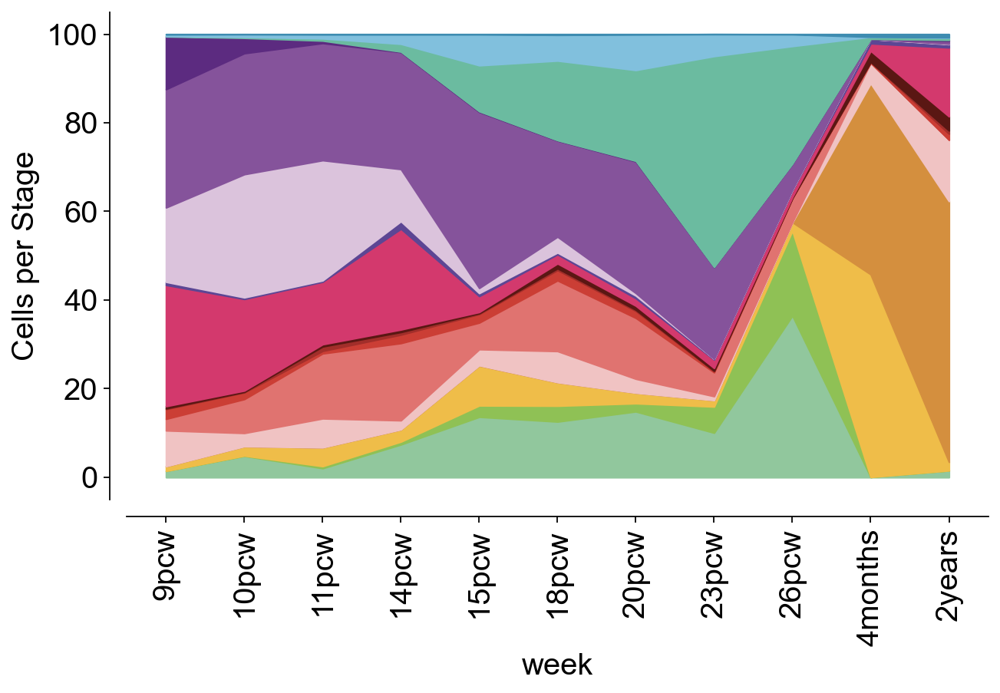

In [33]:
fig, ax = plt.subplots(figsize=(8.5, 6))
ov.pl.cellstackarea(
    adata=rna1,
    celltype_clusters='celltype',
    groupby='week',
    groupby_li=['9pcw','10pcw','11pcw','14pcw','15pcw','18pcw','20pcw','23pcw','26pcw','4months','2years'],
    legend=False, 
    ax=ax,
    ticks_fontsize=18,
    labels_fontsize=18
)


plt.tight_layout()  
plt.show()
fig.savefig('/mnt/home/yihanzhao/RB/fig1/baifenbi-2.png',dpi=300,bbox_inches='tight')

## Roe

In [3]:
rna=sc.read_h5ad('/mnt/home/yihanzhao/RB/data_new/rna_anno.h5ad')

In [34]:
roe = ov.utils.roe(rna1, sample_key='tissue', cell_type_key='celltype', pval_threshold=0.05, expected_value_threshold=1.0)

chi2: 41217.233035021476, dof: 16, pvalue: 0.0


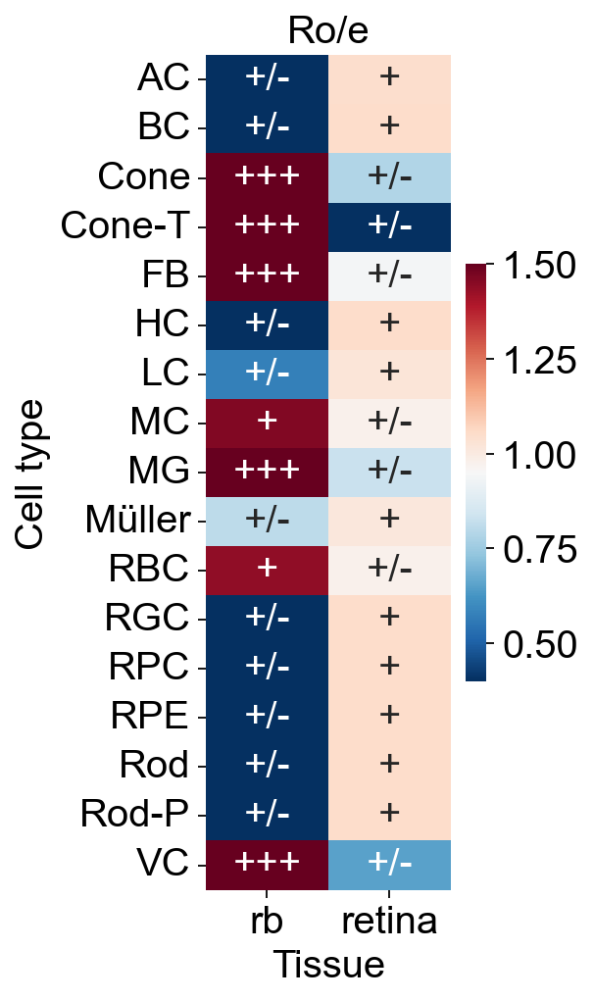

In [37]:
import seaborn as sns
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(2.5,7))

transformed_roe = roe.copy()
transformed_roe = transformed_roe.applymap(
    lambda x: '+++' if x >= 2 else ('++' if x >= 1.5 else ('+' if x >= 1 else '+/-')))

sns.heatmap(roe, annot=transformed_roe, cmap='RdBu_r', fmt='', 
            cbar=True, ax=ax,vmin=0.4,vmax=1.5,cbar_kws={'shrink':0.5})
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

plt.xlabel('Tissue',fontsize=18)
plt.ylabel('Cell type',fontsize=18)
plt.title('Ro/e',fontsize=18)
fig.savefig('/mnt/home/yihanzhao/RB/fig1/roe.png',dpi=300,bbox_inches='tight')

In [24]:
rna1=rna

In [38]:
roe = ov.utils.roe(rna1, sample_key='week', cell_type_key='celltype', pval_threshold=0.05, expected_value_threshold=1.0)

chi2: 98188.38598003381, dof: 160, pvalue: 0.0


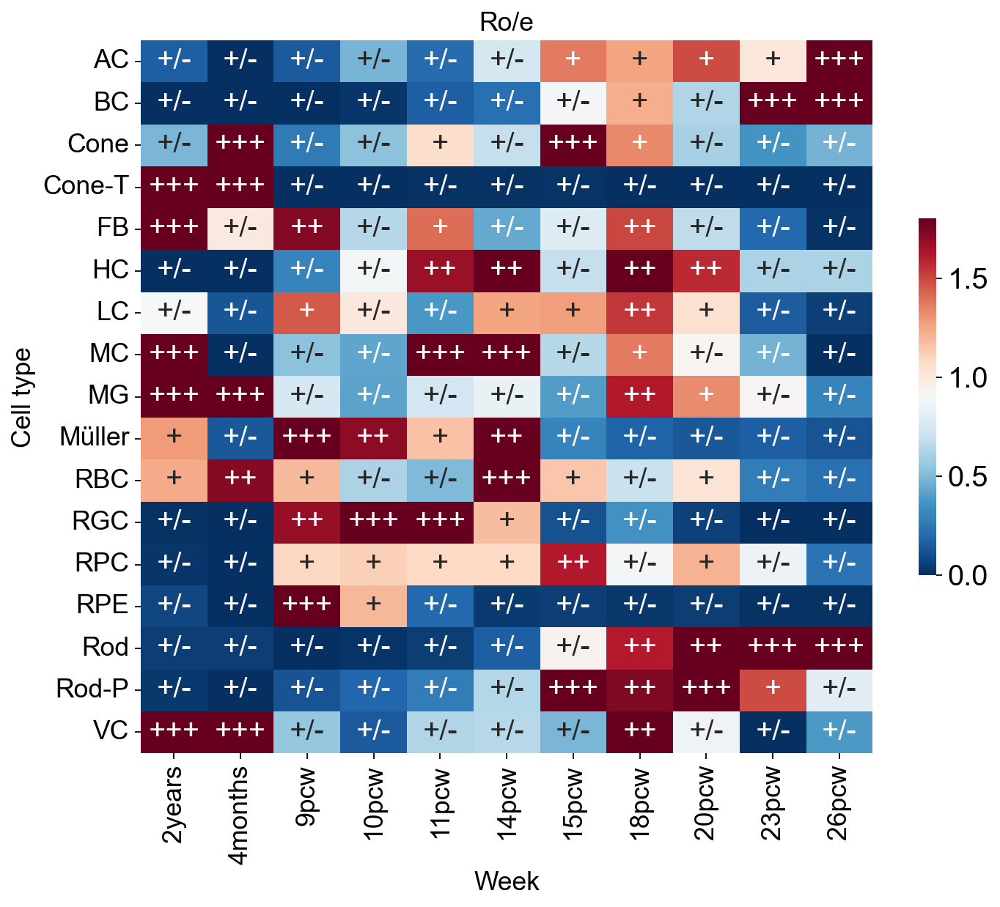

In [41]:
import seaborn as sns
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(10,8))

transformed_roe = roe.copy()
transformed_roe = transformed_roe.applymap(
    lambda x: '+++' if x >= 2 else ('++' if x >= 1.5 else ('+' if x >= 1 else '+/-')))

sns.heatmap(roe, annot=transformed_roe, cmap='RdBu_r', fmt='', 
            cbar=True, ax=ax,vmin=0,vmax=1.8,cbar_kws={'shrink':0.5})
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.xlabel('Week',fontsize=16)
plt.ylabel('Cell type',fontsize=16)
plt.title('Ro/e',fontsize=16)
fig.savefig('/mnt/home/yihanzhao/RB/fig1/sfig1/roe-month.png',dpi=300,bbox_inches='tight')

## matrix

In [6]:
rna=sc.read_h5ad('/mnt/home/yihanzhao/RB/data_new/rna_anno.h5ad')

In [7]:
atac=sc.read_h5ad('/mnt/home/yihanzhao/RB/data_new/atac_anno.h5ad')

In [65]:
atac1=sc.read_h5ad('/mnt/home/yihanzhao/RB/data_new/atac_anno_new.h5ad')

In [18]:
atac.obs=atac1.obs

In [9]:
act=sc.read('/mnt/data/yihan/atac_test/act/act_all_raw_new.h5ad')
act

AnnData object with n_obs × n_vars = 85418 × 61217
    obs: 'tsse', 'n_fragment', 'frac_dup', 'frac_mito', 'sample', 'doublet_probability', 'doublet_score'

In [10]:
new_index = ["cell_" + str(i) for i, _ in enumerate(act.obs.index)]
act.obs.index = new_index
print(act)

AnnData object with n_obs × n_vars = 85418 × 61217
    obs: 'tsse', 'n_fragment', 'frac_dup', 'frac_mito', 'sample', 'doublet_probability', 'doublet_score'


In [20]:
act=act[atac.obs.index.tolist()]
act.obs=atac.obs.copy()
act.obsp=atac.obsp.copy()
act.obsm=atac.obsm.copy()

In [12]:
act.obs.head()

,sample,week,tissue,balancing_weight,domain,transf_celltype,celltype
cell_0,GSM7119499_10pcw_scATAC,10pcw,retina,0.435027,scATAC-seq,RGC,RGC
cell_1,GSM7119499_10pcw_scATAC,10pcw,retina,0.602624,scATAC-seq,RPC,RPC
cell_2,GSM7119499_10pcw_scATAC,10pcw,retina,0.435027,scATAC-seq,RPC,RPC
cell_3,GSM7119499_10pcw_scATAC,10pcw,retina,0.435027,scATAC-seq,RGC,RGC
cell_4,GSM7119499_10pcw_scATAC,10pcw,retina,0.852263,scATAC-seq,RGC,RGC


In [56]:
sc.set_figure_params(scanpy=True, fontsize=18)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_celltype']`


Text(0.67, 0, 'RNA Expression')

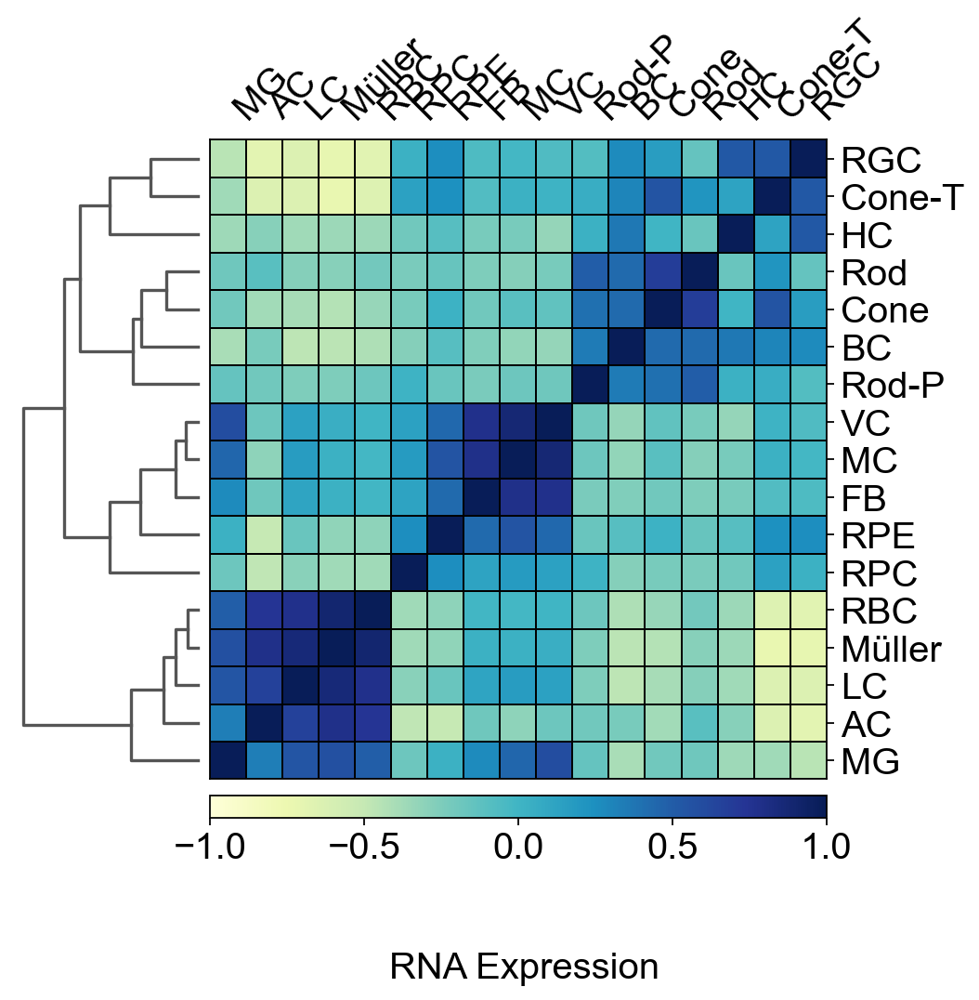

In [60]:
sc.tl.dendrogram(rna1,'celltype')
sc.pl.correlation_matrix(rna1, 'celltype', 
                         figsize=(7,6),
                         cmap='YlGnBu',
                         dendrogram=True,
                         show=False,
                         )
plt.suptitle('RNA Expression',fontsize=18,x=0.67,y=0,horizontalalignment='center')

In [14]:
act.layers['count']=act.X.copy()
sc.pp.normalize_total(
            act, 
#            target_sum=1e4,
        )
sc.pp.log1p(act)

normalizing counts per cell
    finished (0:00:18)


computing PCA
    with n_comps=50
    finished (0:06:44)
Storing dendrogram info using `.uns['dendrogram_celltype']`


Text(0.67, 0, 'Activity')

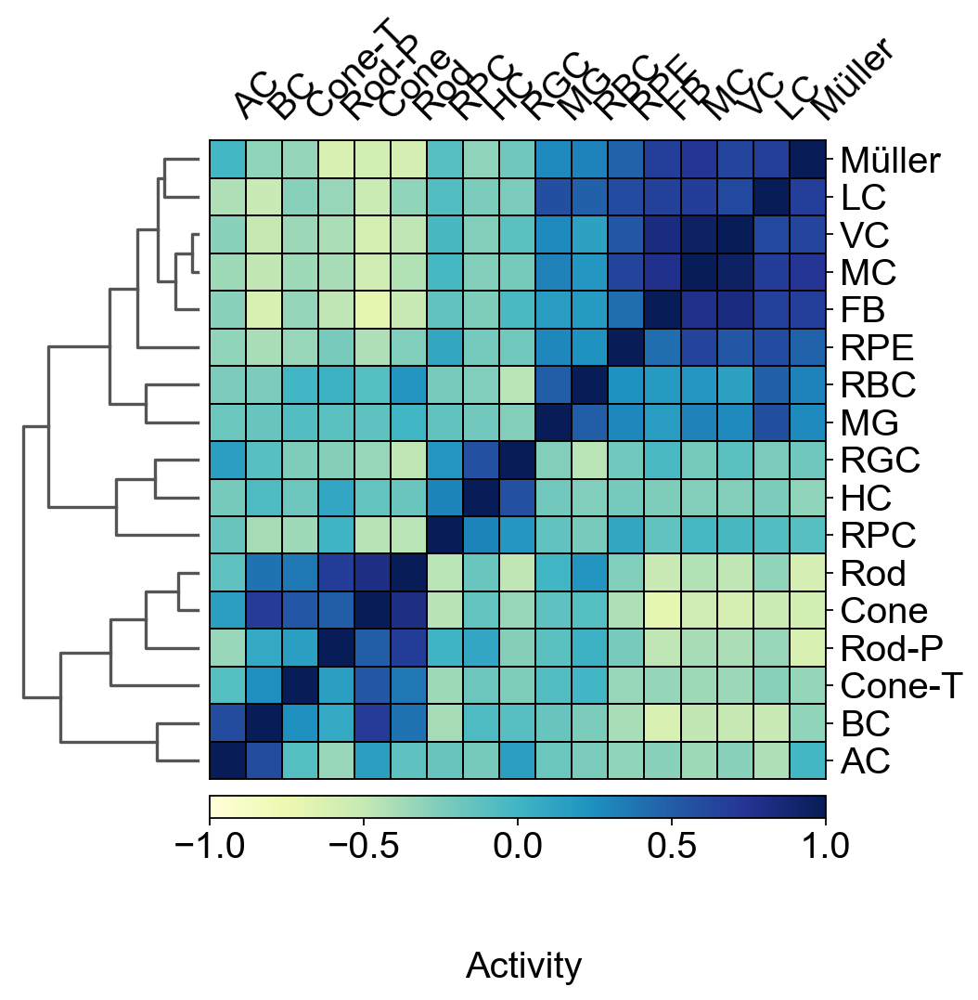

In [63]:
sc.tl.dendrogram(act,'celltype')
sc.pl.correlation_matrix(act, 'celltype', 
                         figsize=(7,6),
                         cmap='YlGnBu',
                         dendrogram=True,
                         show=False,
                         )
plt.suptitle('Activity',fontsize=18,x=0.67,y=0,horizontalalignment='center')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_celltype']`


Text(0.8, 0, 'Activity')

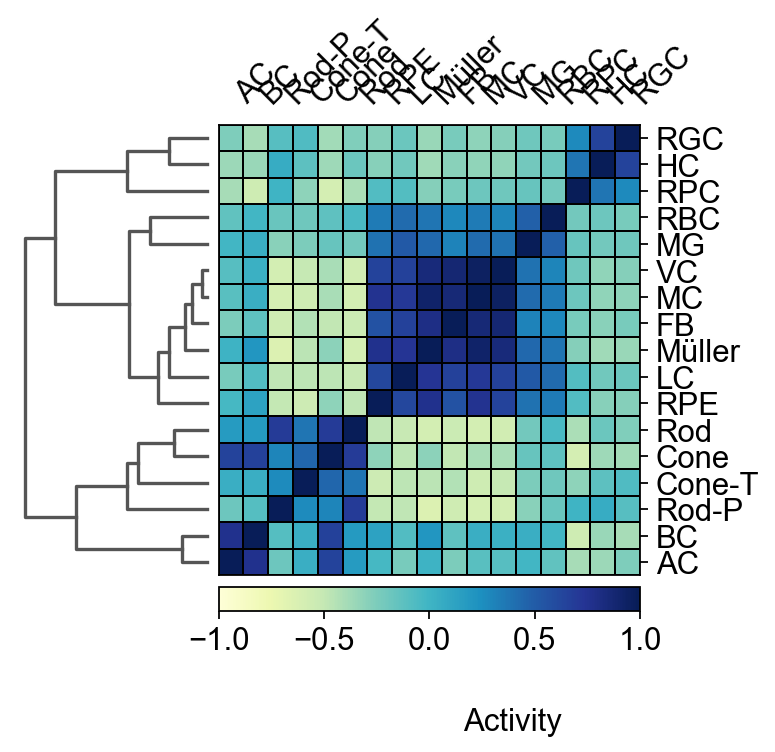

In [21]:
sc.tl.dendrogram(act,'celltype')
sc.pl.correlation_matrix(act, 'celltype', 
                         figsize=(7,6),
                         cmap='YlGnBu',
                         dendrogram=True,
                         show=False,
                         )
plt.suptitle('Activity',fontsize=18,x=0.67,y=0,horizontalalignment='center')

In [62]:
act=sc.read_h5ad('/mnt/home/yihanzhao/RB/data_new/act_anno.h5ad')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_celltype']`


Text(0.8, 0, 'ATAC Expression')

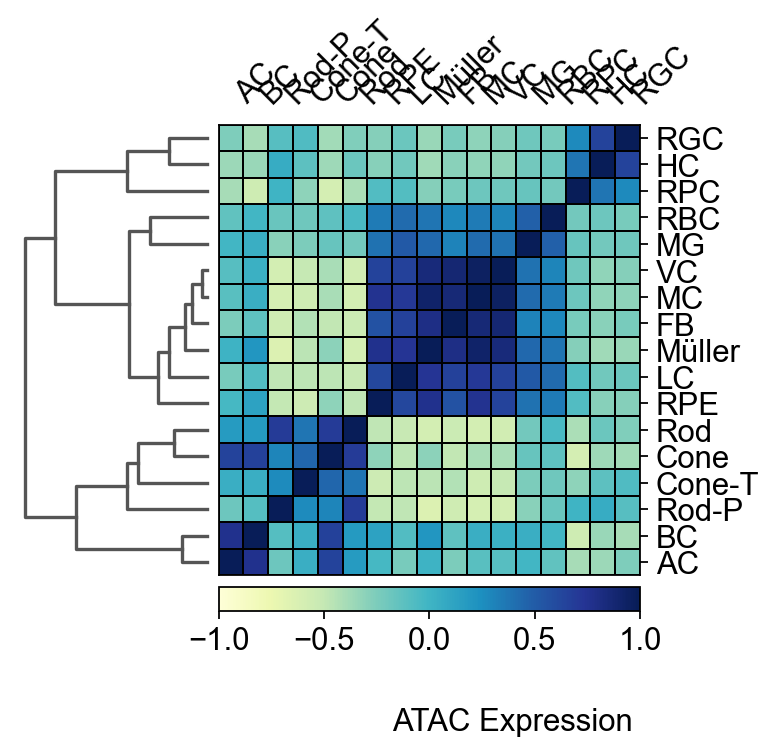

In [19]:
sc.tl.dendrogram(atac,'celltype')
sc.pl.correlation_matrix(atac, 'celltype', 
                         figsize=(5,4),
                         cmap='YlGnBu',
                         dendrogram=True,
                         show=False,
                         )
plt.suptitle('ATAC Expression',fontsize=14,x=0.8,y=0,horizontalalignment='center')

In [5]:
import pychromvar as pc
pc.add_peak_seq(atac, genome_file="/mnt/home/zehuazeng/data/fastq/hg38/hg38.fa", delimiter=":|-")
pc.add_gc_bias(atac)
pc.get_bg_peaks(atac)

100%|██████████████████████████████████████████████| 150000/150000 [00:08<00:00, 17759.50it/s]


In [6]:
from pyjaspar import jaspardb
# get motifs
jdb_obj = jaspardb(release='JASPAR2020')
motifs = jdb_obj.fetch_motifs(
    collection = 'CORE',
    tax_group = ['vertebrates'])

In [7]:
pc.match_motif(atac, motifs=motifs)

100%|████████████████████████████████████████████████| 150000/150000 [21:21<00:00, 117.01it/s]


In [9]:
help(pc.compute_deviations)

Help on function compute_deviations in module pychromvar.compute_deviations:

compute_deviations(data: Union[anndata._core.anndata.AnnData, mudata._core.mudata.MuData], n_jobs=-1) -> anndata._core.anndata.AnnData
    Compute raw and bias-corrected deviations.
    
    Parameters
    ----------
    data : Union[AnnData, MuData]
        AnnData object with peak counts or MuData object with 'atac' modality.
    n_jobs : int, optional
        Number of cpus used for motif matching. If set to -1, all cpus will be used. Default: -1.
    
    Returns
    -------
    Anndata
        An anndata object containing estimated deviations.



In [ ]:
dev = pc.compute_deviations(atac,n_jobs=-1)
dev

In [ ]:
dev.write('data/atac_test/atac_motif_raw.h5ad',compression='gzip')

In [64]:
motif=sc.read_h5ad('/mnt/home/yihanzhao/RB/data_new/atac_motif_raw.h5ad')

In [66]:
motif.var

""
MA0004.1.Arnt
MA0006.1.Ahr::Arnt
MA0019.1.Ddit3::Cebpa
MA0029.1.Mecom
MA0030.1.FOXF2
...
MA0093.3.USF1
MA0526.3.USF2
MA0748.2.YY2
MA0528.2.ZNF263


In [67]:
motif.obs['celltype']=atac1.obs['celltype']

In [68]:
motif.X.max()

6.791833

computing PCA
    with n_comps=50
    finished (0:00:06)
Storing dendrogram info using `.uns['dendrogram_celltype']`


Text(0.67, 0, 'Motif')

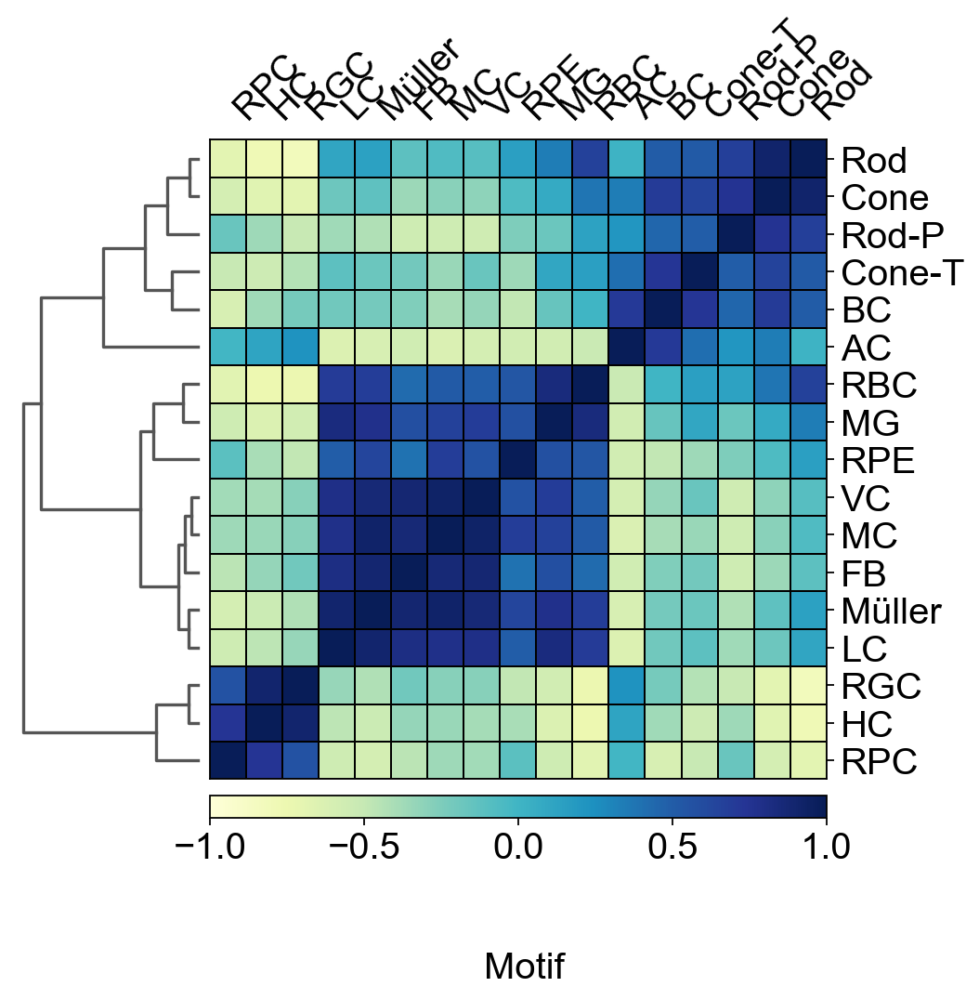

In [69]:
sc.tl.dendrogram(motif,'celltype')
sc.pl.correlation_matrix(motif, 'celltype', 
                         figsize=(7,6),
                         cmap='YlGnBu',
                         dendrogram=True,
                         show=False,
                         )
plt.suptitle('Motif',fontsize=18,x=0.67,y=0,horizontalalignment='center')

computing PCA
    with n_comps=50
    finished (0:00:05)
Storing dendrogram info using `.uns['dendrogram_celltype']`


Text(0.8, 0, 'Motif')

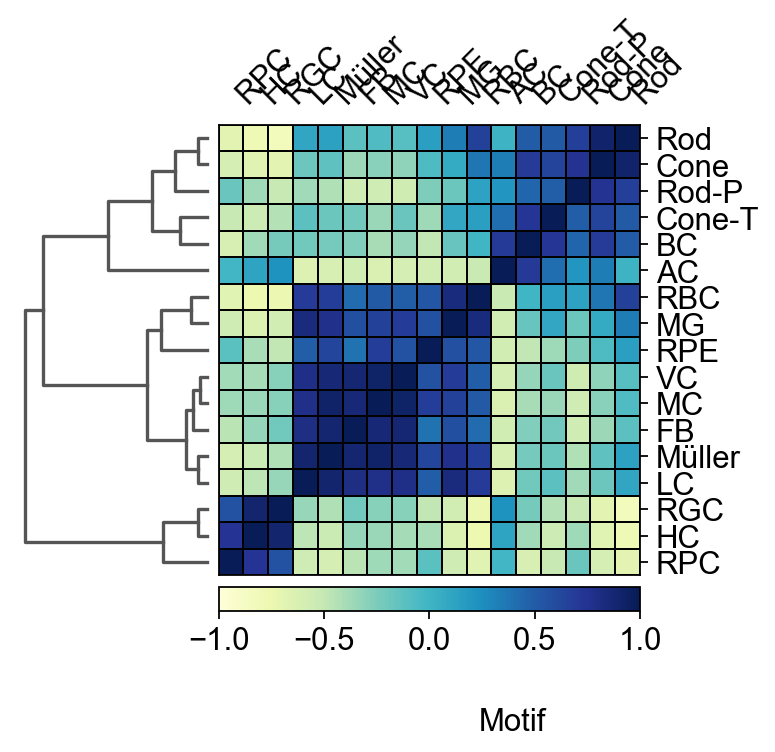

In [26]:
sc.tl.dendrogram(motif,'celltype')
sc.pl.correlation_matrix(motif, 'celltype', 
                         figsize=(5,4),
                         cmap='YlGnBu',
                         dendrogram=True,
                         show=False,
                         )
plt.suptitle('Motif',fontsize=14,x=0.8,y=0,horizontalalignment='center')

## exp-umap

<AxesSubplot: title={'center': 'celltype'}, xlabel='X_mde_scVI1', ylabel='X_mde_scVI2'>

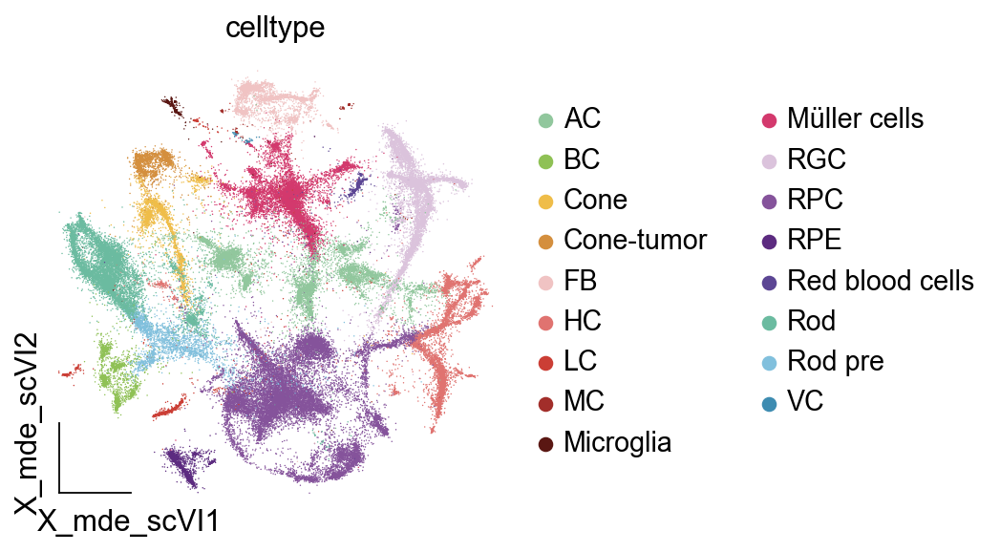

In [4]:
ov.utils.embedding(rna1,
                basis='X_mde_scVI',frameon='small',palette=ov.utils.green_color[:2]+ov.utils.orange_color[:2]+ov.utils.red_color+ov.utils.blue_color[1:],
                color=['celltype'],show=False)

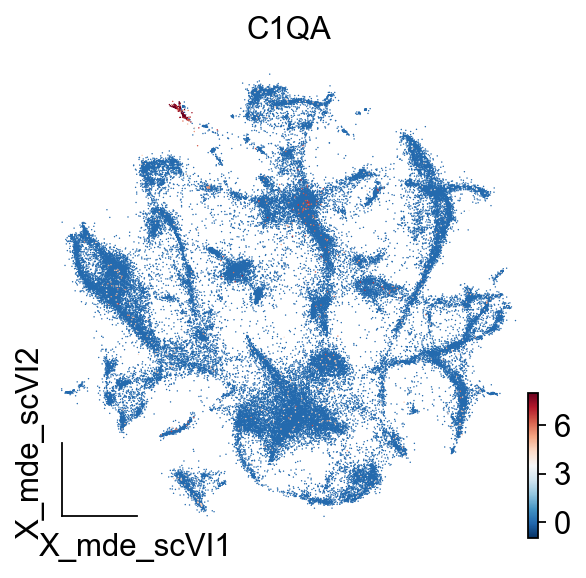

In [10]:
#Microglia
ov.pl.embedding(
    rna1,
    basis="X_mde_scVI",
    color=["C1QA"],
    frameon='small',
    ncols=1,
    vmax=8,
    vmin=-1
)

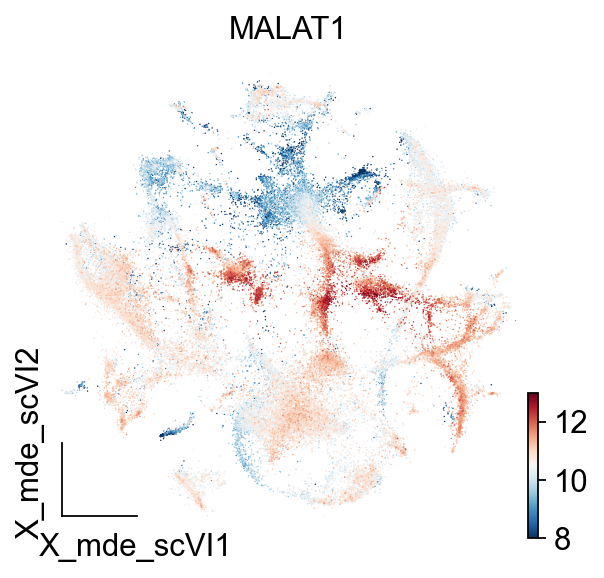

In [15]:
#AC
ov.pl.embedding(
    rna1,
    basis="X_mde_scVI",
    color=["MALAT1"],
    frameon='small',
    ncols=1,
    vmax=13,
    vmin=8
)

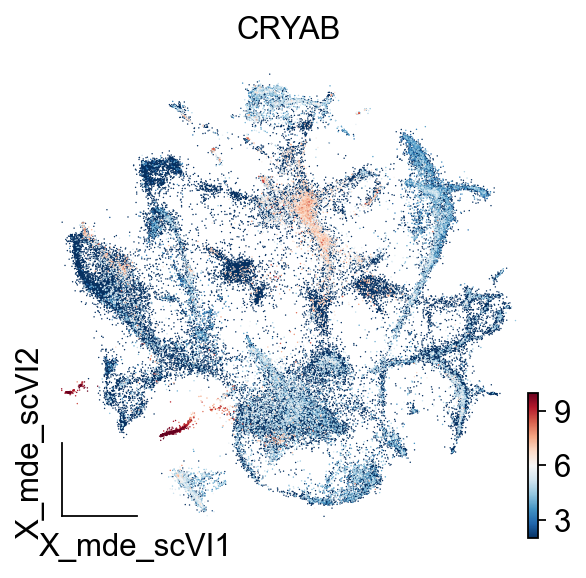

In [18]:
#LC
ov.pl.embedding(
    rna1,
    basis="X_mde_scVI",
    color=["CRYAB"],
    frameon='small',
    ncols=1,
    vmax=10,
    vmin=2
)

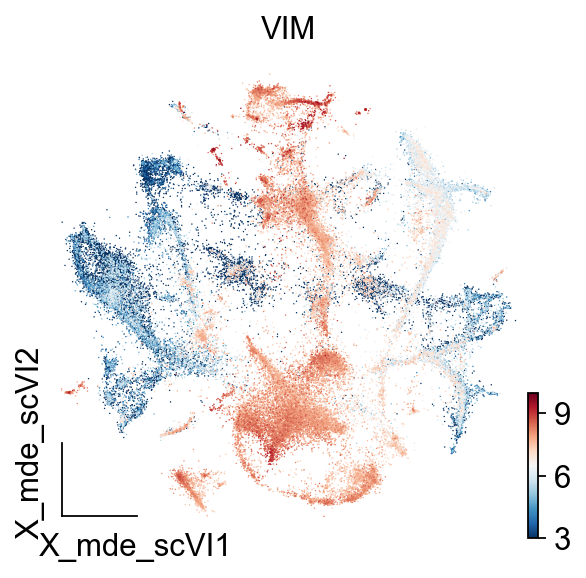

In [25]:
#Muller
ov.pl.embedding(
    rna1,
    basis="X_mde_scVI",
    color=["VIM"],
    frameon='small',
    ncols=1,
    vmax=10,
    vmin=3
)

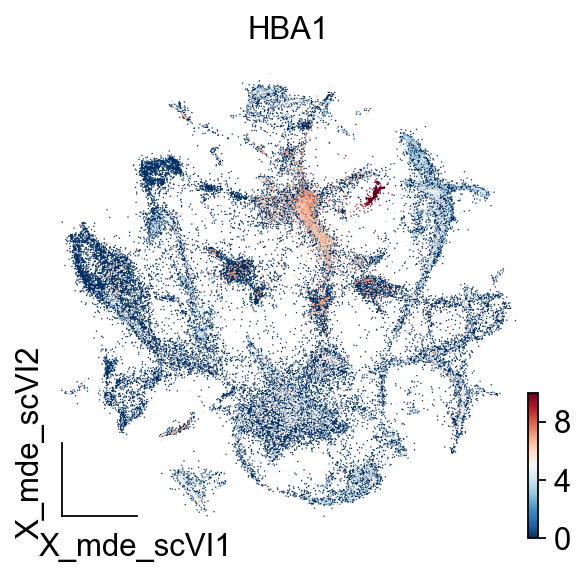

In [29]:
#red blood
ov.pl.embedding(
    rna1,
    basis="X_mde_scVI",
    color=["HBA1"],
    frameon='small',
    ncols=1,
    vmax=10,
    vmin=0
)

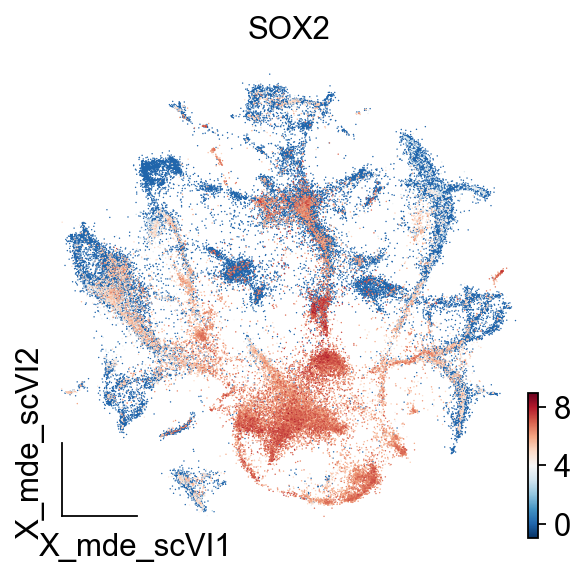

In [33]:
#RPC
ov.pl.embedding(
    rna1,
    basis="X_mde_scVI",
    color=["SOX2"],
    frameon='small',
    ncols=1,
    vmax=9,
    vmin=-1
)

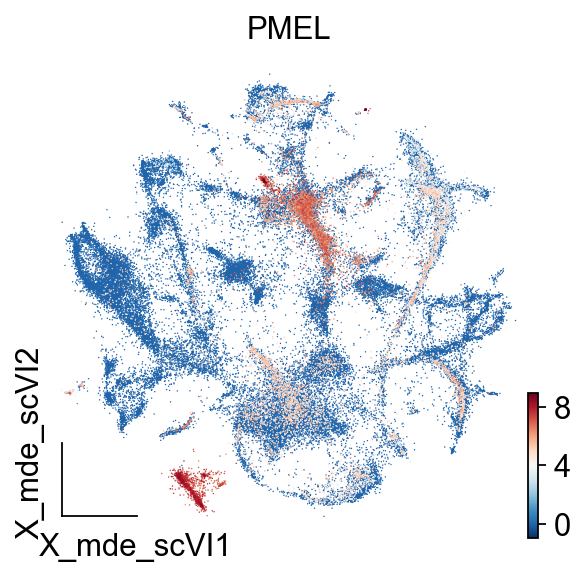

In [35]:
#RPE
ov.pl.embedding(
    rna1,
    basis="X_mde_scVI",
    color=["PMEL"],
    frameon='small',
    ncols=1,
    vmax=9,
    vmin=-1
)

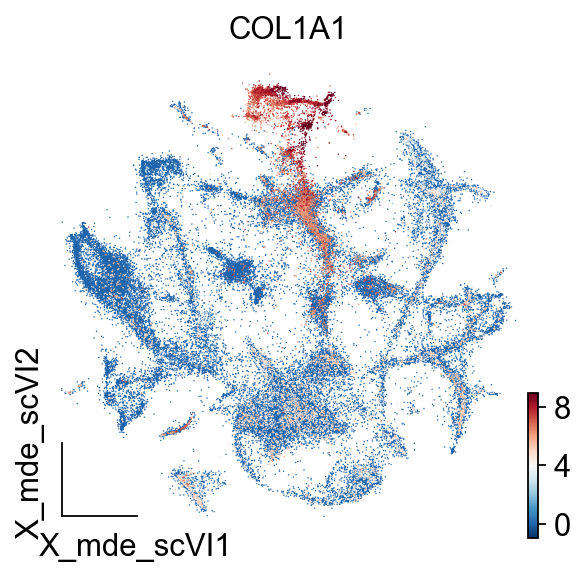

In [38]:
#FB
ov.pl.embedding(
    rna1,
    basis="X_mde_scVI",
    color=["COL1A1"],
    frameon='small',
    ncols=1,
    vmax=9,
    vmin=-1
)

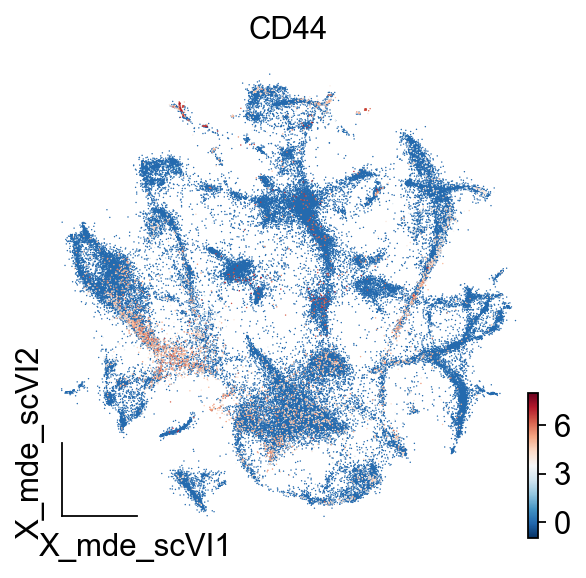

In [45]:
#MC
ov.pl.embedding(
    rna1,
    basis="X_mde_scVI",
    color=["CD44"],
    frameon='small',
    ncols=1,
    vmax=8,
    vmin=-1
)

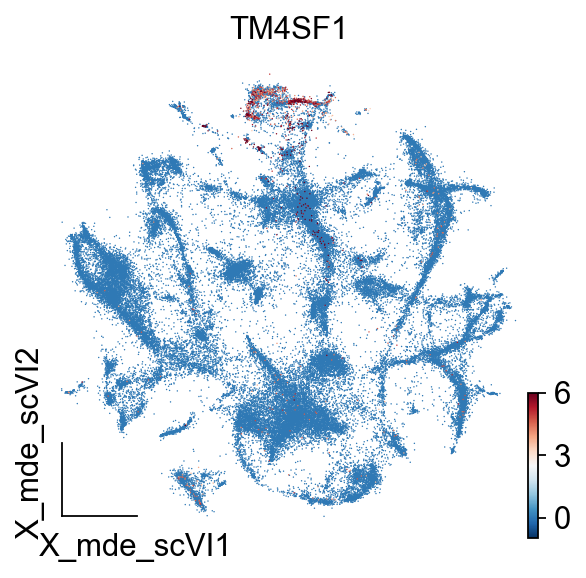

In [51]:
#VC
ov.pl.embedding(
    rna1,
    basis="X_mde_scVI",
    color=["TM4SF1"],
    frameon='small',
    ncols=1,
    vmax=6,
    vmin=-1
)

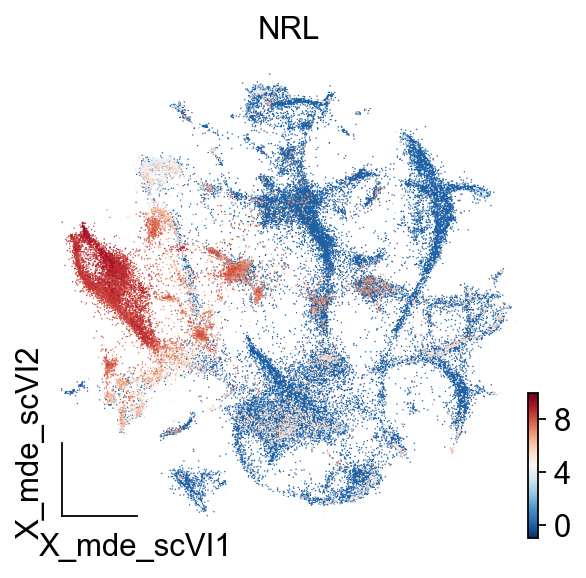

In [54]:
#Rod pre
ov.pl.embedding(
    rna1,
    basis="X_mde_scVI",
    color=["NRL"],
    frameon='small',
    ncols=1,
    vmax=10,
    vmin=-1
)

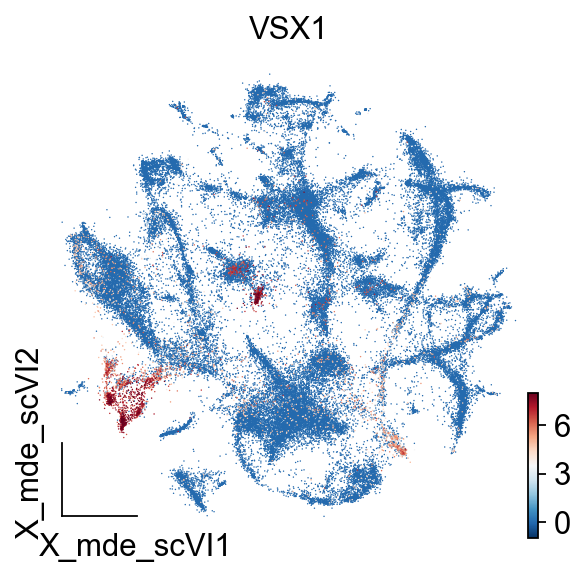

In [56]:
#BC
ov.pl.embedding(
    rna1,
    basis="X_mde_scVI",
    color=["VSX1"],
    frameon='small',
    ncols=1,
    vmax=8,
    vmin=-1
)

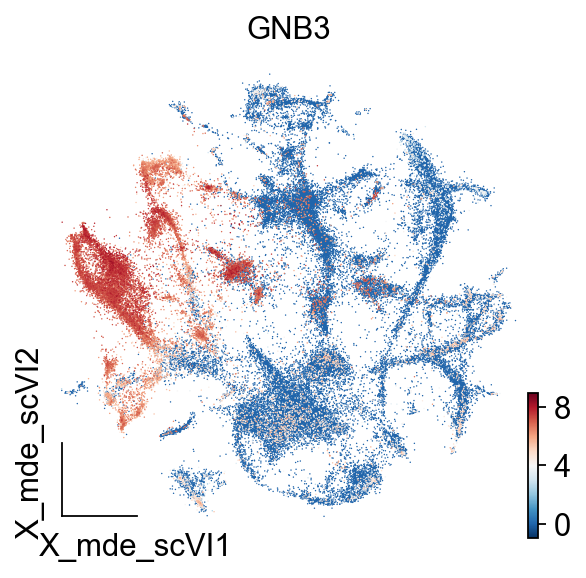

In [59]:
#Cone
ov.pl.embedding(
    rna1,
    basis="X_mde_scVI",
    color=["GNB3"],
    frameon='small',
    ncols=1,
    vmax=9,
    vmin=-1
)

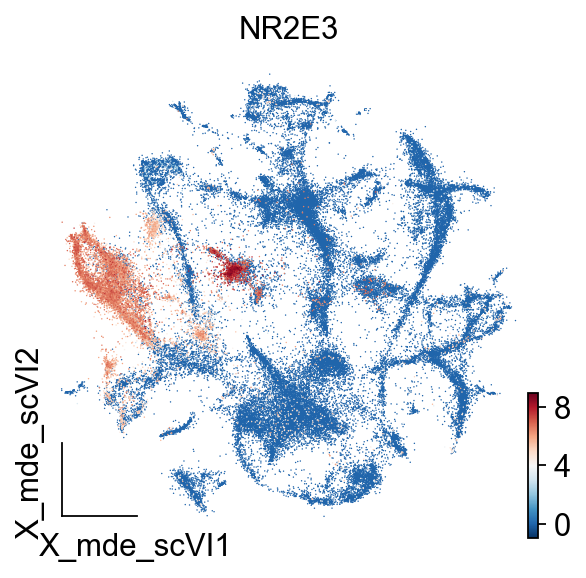

In [62]:
#Rod
ov.pl.embedding(
    rna1,
    basis="X_mde_scVI",
    color=["NR2E3"],
    frameon='small',
    ncols=1,
    vmax=9,
    vmin=-1
)

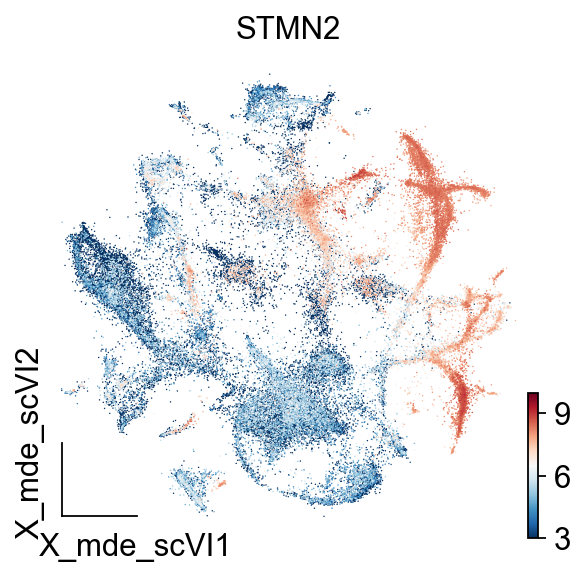

In [67]:
#HC
ov.pl.embedding(
    rna1,
    basis="X_mde_scVI",
    color=["STMN2"],
    frameon='small',
    ncols=1,
    vmax=10,
    vmin=3
)

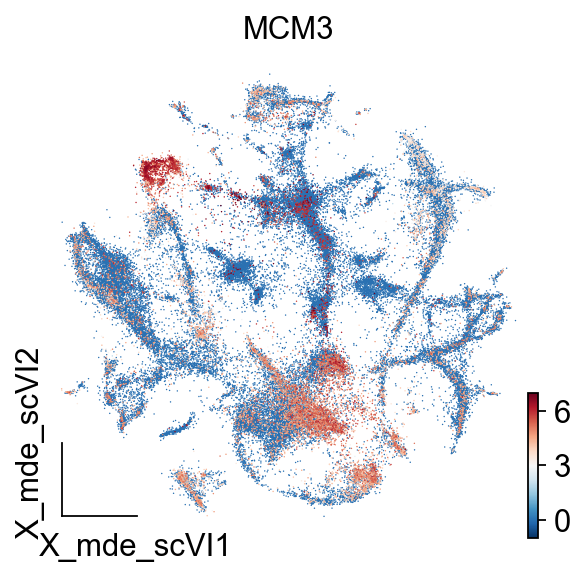

In [73]:
#Cone-tumor
ov.pl.embedding(
    rna1,
    basis="X_mde_scVI",
    color=["MCM3"],
    frameon='small',
    ncols=1,
    vmax=7,
    vmin=-1
)

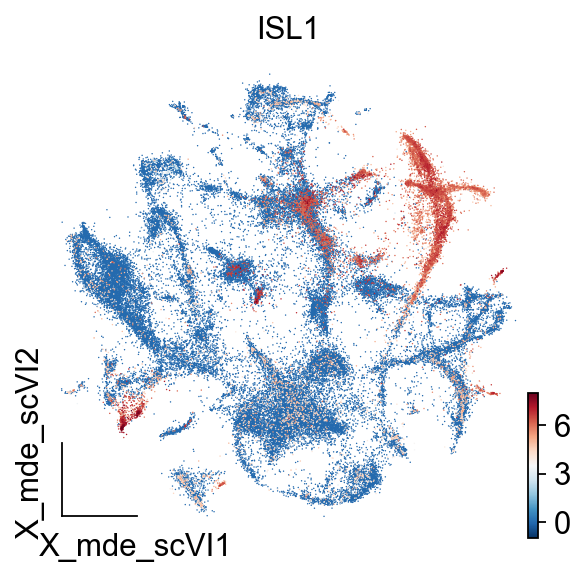

In [76]:
#RGC
ov.pl.embedding(
    rna1,
    basis="X_mde_scVI",
    color=["ISL1"],
    frameon='small',
    ncols=1,
    vmax=8,
    vmin=-1
)